### Imports

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

/tmp/ipykernel_3230851/3777615979.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [2]:
import torch
import pandas as pd
import numpy as np
import yaml
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import matplotlib.patches as patches
from scipy.stats import spearmanr
from sklearn.cross_decomposition import CCA
from sklearn import datasets
from sklearn import decomposition
from sklearn.preprocessing import StandardScaler
import mantel
from sknetwork.clustering import Louvain
from sklearn.cluster import DBSCAN
import harmonypy as hm
from harmony import harmonize
import seaborn as sns
from sklearn.metrics.pairwise import cosine_similarity, cosine_distances
from umap import UMAP
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
import label_dict
from label_dict import protein_to_num_single_cells, protein_to_num_full
from label_dict import hierarchical_organization_single_cell_low_level, hierarchical_organization_single_cell_high_level
from label_dict import hierarchical_organization_whole_image_low_level, hierarchical_organization_whole_image_high_level
from tqdm import tqdm
from scipy.stats import ttest_ind, zscore, norm
from statsmodels.stats.weightstats import ztest as ztest
from skimage import io
from matplotlib import cm
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from scipy.spatial.distance import pdist, cdist
from seaborn import clustermap
from scipy.spatial.distance import squareform
import cuml
from sklearn.metrics import average_precision_score

cmap = cm.nipy_spectral


### Utility functions

In [7]:
def scale(features, features_mean=None, features_std=None):
    if features_mean is None:
        features_mean = features.mean(axis=0)
    if features_std is None:
        features_std = features.std(axis=0)
    transformed_features = (features - features_mean) / (features_std + 0.00001)
    return transformed_features, features_mean, features_std

def get_embeddings(features_to_fit, features_to_transform, labels=None):
#     scaled_features_to_fit, features_mean, features_std = scale(features_to_fit)
#     scaled_features_to_transform, features_mean, features_std = scale(features_to_transform, features_mean, features_std)
    scaled_features_to_fit = features_to_fit
    scaled_features_to_transform = features_to_transform
    
    umap_unique = cuml.UMAP(init='spectral', metric='euclidean', min_dist=0.1, n_neighbors=15, n_components=2, spread=4, output_type="numpy", verbose=True, n_epochs=2600, transform_queue_size=20, random_state=42)
    umap_unique = umap_unique.fit(scaled_features_to_fit.numpy(), y=labels)
    transformed_features = umap_unique.transform(scaled_features_to_transform.numpy())
    return umap_unique, 0, 0, transformed_features, scaled_features_to_transform


def plot_UMAP_one_per_label(df, cell_labels, protein_labels, embedding, title):
    plt.figure()
    plt.plot(np.nan, np.nan)    

    mat, cell_labels = get_col_matrix(df, cell_labels)
    protein_mat, protein_labels = get_col_matrix(df, protein_labels)
    for i in np.argsort(mat.sum(axis=0))[-10:]:    
        indices = np.where((mat[:, i] == 1) & (mat[:,:].sum(axis=1) == 1))[0]
        cell_name = cell_labels[i]
        plt.figure(figsize=(10,10), facecolor='white')
        plt.axis(False)
        plt.scatter(embedding[:, 0], 
                    embedding[:, 1],
                    s=0.1,
                    color='lightgrey'
                   )
        plt.scatter(embedding[indices, 0], 
                    embedding[indices, 1],
                    s=0.1,
                    color='black'
                   )

        plt.xlabel('UMAP 1')
        plt.ylabel('UMAP 2')
        plt.title(f'{title}, {cell_name}', fontsize=15)

        plt.figure(figsize=(10,10), facecolor='white')
        plt.axis(False)
        plt.scatter(embedding[:, 0], 
                    embedding[:, 1],
                    s=0.1,
                    label='All data',
                    color='lightgrey',
                    alpha=0.25
                   )
        plt.axis(False)
        plt.scatter(embedding[indices, 0], 
                    embedding[indices, 1],
                    s=0.1,
                    label='All data',
                    color='grey'
                   )        
        for i in range(protein_mat.shape[1]):
            protein_indices = np.where((protein_mat[indices, i] == 1) & (protein_mat[indices,:].sum(axis=1) == 1))[0]
            plt.scatter(embedding[indices[protein_indices], 0], 
                        embedding[indices[protein_indices], 1],
                        s=0.1,
                        label=protein_labels[i],
                        color=cmap(i / protein_mat.shape[1])
                       )

        plt.xlabel('UMAP 1')
        plt.ylabel('UMAP 2')
        plt.title(f'{title}, {cell_name}, protein localizations', fontsize=15)
            

def plot_UMAP(df, labels, embedding, title):
    mat, labels = get_col_matrix(df, labels)
    plt.figure()
    plt.plot(np.nan, np.nan)    
    plt.figure(figsize=(10,10), facecolor='white')
    plt.axis(False)
    plt.scatter(embedding[:, 0], 
                embedding[:, 1],
                s=0.1,
                label='All data',
                color='grey'
               )
    for i in range(mat.shape[1]):
        indices = np.where((mat[:, i] == 1) & (mat[:,:].sum(axis=1) == 1))[0]
        plt.scatter(embedding[indices, 0], 
                    embedding[indices, 1],
                    s=0.1,
                    label=labels[i],
                    color=cmap(i / mat.shape[1])
                   )

    plt.xlabel('UMAP 1')
    plt.ylabel('UMAP 2')
    plt.title(title, fontsize=15)
    lgnd = plt.legend(bbox_to_anchor=(1,1), frameon=False)
    for h in lgnd.legendHandles:
        h._sizes = [30]

def get_col_matrix(df, labels):
    if len(labels) == 1:
        values = df[labels[0]]
        unique_values = sorted(np.unique(values))
        mat = np.zeros((len(df), len(unique_values)))
        for ind, value in enumerate(unique_values):
            mat[np.where(values == value)[0], ind] = 1
        columns = unique_values
    else:
        mat = df[sorted(labels)].values.astype(int)
        columns = sorted(labels)
    return mat, columns

def get_averaged_features(df, features, labels, sort=True):
    mat, columns = get_col_matrix(df, labels)
    averaged_features = []
    for key in range(len(columns)):
        indices = np.where(mat[:,key])
        averaged_features.append(features[indices].mean(axis=0))
    averaged_features = torch.stack(averaged_features)
    return averaged_features, columns

def get_heirarchical_clustering(df, features, labels, zero_diagonal=True, metric='similarity'):
    averaged_features, columns = get_averaged_features(df, features, labels)
    if metric == 'similarity':
        distance_matrix = cosine_similarity(averaged_features, averaged_features)
    else:
        distance_matrix = cosine_distances(averaged_features, averaged_features)
        
    Z = linkage(distance_matrix)
    plt.figure(figsize=(20,5))
    dn = dendrogram(Z, labels = columns)
    plt.xticks(rotation=45)
    distance_matrix = distance_matrix[dn['leaves'], :][:, dn['leaves']]
    columns = dn['ivl']
    plt.figure(figsize=(10,10))
    if zero_diagonal:
        for i in range(len(distance_matrix)):
            distance_matrix[i,i] = 0
    plt.imshow(distance_matrix)
    plt.xticks(range(len(columns)), columns, rotation=90)
    plt.yticks(range(len(columns)), columns)
    return distance_matrix, columns, Z

def get_heterogeneousity_per_whole_image(df, features, indices, metric='distance', verbose=False):
    cells_per_ID = df.iloc[indices].groupby('ID').groups
    mean_distances_per_ID = []
    for ID in tqdm(sorted(cells_per_ID.keys()), disable=verbose == False):
        if metric == 'distance':
            distance_matrix = cosine_distances(features[cells_per_ID[ID]], 
                                                features[cells_per_ID[ID]])
            distances = np.triu(distance_matrix)[np.triu_indices(distance_matrix.shape[0], k=1)]
            if len(distances) == 0: continue
            mean_distances_per_ID.append(distances.mean())
        elif metric == 'std':
            mean_distances_per_ID.append(features[cells_per_ID[ID]].std(axis=0).mean().item())
    return mean_distances_per_ID, sorted(cells_per_ID.keys())

def get_heterogeneousity_per_gene(merged_df, features, indices, metric='distance', verbose=False):
    cells_per_gene = merged_df.iloc[indices].groupby(['Gene']).groups
    keys = sorted(cells_per_gene.keys())
    mean_distances_per_ID = []
    for gene in tqdm(keys):
        if metric == 'distance':
            distance_matrix = cosine_distances(features[cells_per_gene[gene]], 
                                                features[cells_per_gene[gene]])
            distances = np.triu(distance_matrix)[np.triu_indices(distance_matrix.shape[0], k=1)]
            if len(distances) == 0: continue
            mean_distances_per_ID.append(distances.mean())
        elif metric == 'std':
            mean_distances_per_ID.append(features[cells_per_gene[gene]].std(axis=0).mean().item())
    return mean_distances_per_ID, keys

def get_heterogeneity_df(config_file):
    config = yaml.safe_load(open(config_file, "r"))
    df = pd.read_csv(config['embedding']['df_path'])
    df_master = pd.read_csv('/scr/mdoron/Dino4Cells/Master_scKaggle.csv')
    df = pd.merge(df, df_master[['ID','gene']], on='ID')
    df['Gene'] = df['gene']
    proto_heterogeneity_df = pd.read_csv('/scr/mdoron/Dino4Cells/data/gene_heterogeneity.tsv', delimiter='\t')
    proto_heterogeneity_df['v_spatial'] = proto_heterogeneity_df['Single-cell variation spatial']
    proto_heterogeneity_df['v_intensity'] = proto_heterogeneity_df['Single-cell variation intensity']
    proto_heterogeneity_df['HPA_variable'] = np.nan
    proto_heterogeneity_df.loc[(pd.isnull(proto_heterogeneity_df['v_intensity']) == False),'v_intensity'] = True
    proto_heterogeneity_df.loc[(pd.isnull(proto_heterogeneity_df['v_intensity'])),'v_intensity'] = False
    proto_heterogeneity_df.loc[(pd.isnull(proto_heterogeneity_df['v_spatial']) == False),'v_spatial'] = True
    proto_heterogeneity_df.loc[(pd.isnull(proto_heterogeneity_df['v_spatial'])),'v_spatial'] = False
    proto_heterogeneity_df.loc[(proto_heterogeneity_df['v_spatial']) | (proto_heterogeneity_df['v_intensity']), 'HPA_variable'] = True
    heterogeneity_df = pd.merge(proto_heterogeneity_df, df, on='Gene')[['Gene','ID','v_spatial','v_intensity','HPA_variable', 'cell_type']]
    return heterogeneity_df

def find_gene_enrichment(config_file, heterogenous_type = 'HPA_variable', granularity='gene', condition = None, use_embedding=False):
    config = yaml.safe_load(open(config_file, "r"))
    df = pd.read_csv(config['embedding']['df_path'])    
    heterogeneity_df = get_heterogeneity_df(config_file)
    merged_df = pd.merge(heterogeneity_df, df, on='ID', how='right').drop_duplicates()
    merged_df.loc[pd.isnull(merged_df['Gene']),'Gene'] = ''
    merged_df = merged_df.reset_index()
    merged_df['original_index'] = merged_df.index.values
    merged_df['cell_type'] = merged_df.cell_type_x
    original_indices = merged_df.original_index.values
    gene_to_ind = merged_df[['Gene','original_index']].groupby('Gene').groups
    gene_to_ind = {k : original_indices[gene_to_ind[k]] for k in gene_to_ind.keys()}
    merged_df[pd.isnull(merged_df.Gene)].Gene = ''
    features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
        
    if condition == 'U-2 OS':
        features = features[np.where(merged_df.cell_type == 'U-2 OS')[0]]
        merged_df = merged_df[merged_df.cell_type == 'U-2 OS'].reset_index()
    else:
        merged_df = merged_df.reset_index()
        
    if use_embedding:
        umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features), torch.Tensor(features))  
        scaled_features = embedding
    else:
        scaled_features, features_mean, features_std = scale(features)
        scaled_features = scaled_features.numpy()
    indices = merged_df.index.values
    merged_df['original_index'] = merged_df.index.values

    if granularity == 'gene':
        mean_stds, sorted_genes = get_heterogeneousity_per_gene(merged_df, scaled_features, indices, metric='std', verbose=False)
    elif granularity == 'image':
        mean_stds, sorted_images = get_heterogeneousity_per_whole_image(merged_df, scaled_features, indices, metric='std', verbose=False)

    metric = mean_stds
    sorted_distances = np.array(metric)[np.argsort(metric)[::-1]]
    if granularity == 'gene':
        genes_sorted = np.array(sorted_genes)[np.argsort(metric)[::-1]]
        enrichment_raw = pd.DataFrame(genes_sorted)[0].isin(merged_df[merged_df[heterogenous_type] == True].Gene.unique()).values
        enrichment = []
        for ind in tqdm(range(1, len(genes_sorted), 1)):
            enrichment.append(enrichment_raw[:ind].mean())    
        images_sorted = None
        sorted_distances_per_image = None
        sorted_distances_per_gene = sorted_distances
    elif granularity == 'image':
        images_sorted = np.array(sorted_images)[np.argsort(metric)[::-1]]
        merged_df['image_rank'] = merged_df.ID.map(dict(zip(images_sorted, range(len(images_sorted)))))
        merged_df['image_score'] = merged_df.ID.map(dict(zip(images_sorted, sorted_distances)))
        genes_and_image_ranks = merged_df.groupby('Gene')['image_rank'].min()
        genes_and_image_scores = merged_df.groupby('Gene')['image_score'].max()
        genes_ranked_by_images_scores = genes_and_image_scores.values
        genes_ranked_by_images_rank = genes_and_image_ranks.values
        genes_ranked_by_images_names = genes_and_image_ranks.index.values
        genes_sorted = genes_ranked_by_images_names[np.argsort(genes_ranked_by_images_rank)]

        enrichment_raw = pd.DataFrame(genes_sorted)[0].isin(merged_df[merged_df[heterogenous_type] == True].Gene.unique()).values
        enrichment = []
        for ind in tqdm(range(1, len(genes_sorted), 1)):
            enrichment.append(enrichment_raw[:ind].mean())
        sorted_distances_per_image = sorted_distances
        sorted_distances_per_gene = np.array(genes_ranked_by_images_scores)[np.argsort(genes_ranked_by_images_scores)[::-1]]

    return enrichment, merged_df, genes_sorted, images_sorted, sorted_distances_per_gene, sorted_distances_per_image
    
def explore_single_gene(features, protein_localizations, merged_df, embedding, genes_sorted, gene_rank, number_of_clusters=2, color_by='whole_image', cell_preds=None):
    gene2uniprot = pd.read_csv('XML_df/HPA_img_df_new.csv')[['gene','uniport_id']].drop_duplicates()
    uniprot2name = pd.read_csv('uniport_interactions.tsv', delimiter='\t')[['Entry','Gene Names']].drop_duplicates()
    gene2name = pd.merge(uniprot2name, gene2uniprot, right_on='uniport_id', left_on='Entry')[['gene','Gene Names']]
    t=number_of_clusters
    rank = gene_rank
    merged_df['rank'] = merged_df.Gene.map(dict(zip(genes_sorted, range(len(genes_sorted)))))
    gene = genes_sorted[rank]
    gane_name = gene2name[gene2name.gene == gene]['Gene Names'].iloc[0].split(' ')[0]
    gene_indices = np.where(merged_df.Gene == gene)[0]
    gene_df = merged_df.iloc[gene_indices].reset_index()
    targets = torch.Tensor(protein_localizations)
    if color_by == 'whole_image':
        gene_df['well'] = gene_df.ID
        color_by_name = 'Image ID'
    elif color_by == 'plate':
        gene_df['well'] = gene_df.ID.apply(lambda x:x.split('_')[0])
        color_by_name = 'Plate'
    elif color_by == 'well':
        gene_df['well'] = gene_df.ID.apply(lambda x:x.split('_')[1])
        color_by_name = 'Well'
    dists = pdist(features[gene_indices], metric='euclidean')
    Z = linkage(dists, 'ward')
    clusters = fcluster(Z, criterion='maxclust', t=t)
    fig, ax = plt.subplots(1,1, figsize=(5,5), facecolor='white')
    plt.scatter(np.NaN,np.NaN)
    
    fig, ax = plt.subplots(1,1, figsize=(5,5), facecolor='white')
    plt.title(f'UMAP embedding of all single cells stained for gene {gane_name}\nrank: {rank + 1}, ground truth: {"heterogeneous" if gene_df.HPA_variable.iloc[0] == True else "unlabeled"}')

    channels = [0]
    markers = ['*','^','o','|','v','s']
    wells = np.unique(gene_df.well)
    colors = {wells[i] : 'rgbkymrgbkymrgbkym'[i] for i in range(len(wells))}
    markers = {i : markers[i - 1] for i in np.unique(clusters)}

    for label in np.unique(clusters):
        indices = np.where(clusters == label)[0]
        gene_df.loc[indices,'cluster'] = label

    inds = []
    embedding, _ = get_embeddings(features[gene_indices])
    for cluster in range(1, max(clusters) + 1):
        indices = np.where(clusters == cluster)[0]
        plt.scatter(embedding[indices,0], 
                    embedding[indices,1],
#                     marker=markers[cluster],
                    c=[colors[i] for i in gene_df.iloc[indices].well],
                   label=f'Cluster {cluster}')

    ax2 = ax.twinx()
    for w in wells:
        ax2.scatter(np.NaN, np.NaN, color=colors[w], label=f'Image {w}', marker = 'o')
    ax2.get_yaxis().set_visible(False)

#     lgnd = ax.legend(frameon=False, scatterpoints=1, fontsize=10, loc='upper left', title='Raw feature clustering')
#     for h in lgnd.legendHandles: h._original_facecolor = 'black'
    ax2.legend(frameon=False, loc='lower right', title='Image IDs')

    ax.axis('off')
    ax2.axis('off')
    plt.tight_layout()

    row_colors1 = gene_df['well'].map(colors)
    row_colors1.name = color_by_name

    b = ((targets[gene_indices]).numpy()).astype(int)
    c2 = [str(list(i)) for i in b]
    lut1 = dict(zip(np.unique(c2), [cmap(i / len(np.unique(c2))) for i in range(len(np.unique(c2)))]))
    series = pd.DataFrame(c2)[0]
    series.name = 'Labels'
    row_colors3 = series.map(lut1)
    row_colors = pd.concat([row_colors1,row_colors3],axis=1)
        
    if cell_preds is not None:
        b = ((cell_preds[gene_indices])).astype(int)
        c1 = [str(list(i)) for i in b]
        series = pd.DataFrame(c1)[0]
        series.name = 'Prediction'
        lut1 = dict(zip(np.unique(c1), [cmap(i / len(np.unique(c1))) for i in range(len(np.unique(c1)))]))
        row_colors2 = series.map(lut1)
        row_colors = pd.concat([row_colors1,row_colors2,row_colors3],axis=1)

    c = clustermap(pd.DataFrame(squareform(dists)),
                   figsize=(7.5,7.5),
                   cbar_pos=None, 
                   xticklabels=[], 
                   yticklabels=[], 
                   cmap='Blues', 
                   dendrogram_ratio=[0,0],
                   col_cluster=True,
                   row_cluster=True,
                   row_colors = row_colors,
                   cbar_kws={"size": 20},
                   facecolor='white'
    )
    # c.ax_row_colors.set_xlabel('Well', fontsize=18, rotation=90)
    num_to_protein = {protein_to_num_single_cells[k] : k for k in protein_to_num_single_cells.keys()}
    for cluster in np.unique(clusters):
        plt.figure(figsize=(5,5), facecolor='white')
        plt.imshow(io.imread(gene_df[(gene_df.cluster == cluster)].file.iloc[0])[:,:,channels], cmap='Greys_r', vmin=0, vmax=255)
        plt.grid(None)
        plt.axis('off')
        plt.title(f'cluster {cluster}, {", ".join([num_to_protein[i] for i in np.where(targets[gene_indices][np.where(gene_df.cluster == cluster)[0][0]])[0]])}')

    for ID in gene_df.ID.unique():
        gene_type = 'heterogeneous' if merged_df[merged_df.ID == ID].HPA_variable.iloc[0] == True else 'unlabeled'
        img = io.imread(f'/scr/mdoron/Dino4Cells/data/whole_images/{ID}.png')
        fig, axes = plt.subplots(1,2,figsize=(10,5))
        axes[0].imshow(img[:,:,[0,2,3]])
        axes[0].axis(False)
        axes[1].imshow(img[:,:,[1]], cmap='Greys_r')
        axes[1].axis(False)
        axes[0].set_title('Non protein channels')
        axes[1].set_title('Protein channel')
        plt.tight_layout()

def get_gene_heterogeneity_enrichement(config_files, heterogenous_type='HPA_variable', condition=None, use_embedding=False):
    enrichments_conditioned_on_gene = []
    enrichments_conditioned_on_image = []
    genes_sorted_conditioned_on_image = []
    genes_sorted_conditioned_on_gene = []
    merged_dfs = []
    sorted_metrics_conditioned_on_image = []
    sorted_metrics_conditioned_on_gene = []
    images_sorted_conditioned_on_image = []
    average_precisions_condition_on_gene = []
    average_precisions_condition_on_image = []
    for config_file in config_files:
        enrichment, merged_df, genes_sorted, _, sorted_metric_conditioned_on_gene, _ = find_gene_enrichment(config_file, heterogenous_type = heterogenous_type, condition=condition, use_embedding=use_embedding, granularity='gene')
        sorted_metrics_conditioned_on_gene.append(sorted_metric_conditioned_on_gene)
        genes_sorted_conditioned_on_gene.append(genes_sorted)
        enrichments_conditioned_on_gene.append(enrichment)
        gene_ground_truth = pd.merge(pd.DataFrame(genes_sorted, columns=['Gene']), merged_df[['Gene','HPA_variable']].drop_duplicates(), on='Gene')['HPA_variable'].apply(lambda x:pd.isnull(x) == False).astype(int).values
        gene_predictions = np.where(np.isnan(sorted_metric_conditioned_on_gene), 0, sorted_metric_conditioned_on_gene)
        average_precisions_condition_on_gene.append(average_precision_score(gene_ground_truth, gene_predictions))

        enrichment, merged_df, genes_sorted, images_sorted, sorted_metric_conditioned_on_gene, sorted_metric_conditioned_on_image = find_gene_enrichment(config_file, heterogenous_type = heterogenous_type, condition=condition, use_embedding=use_embedding, granularity='image')
        sorted_metrics_conditioned_on_image.append(sorted_metric_conditioned_on_gene)
        genes_sorted_conditioned_on_image.append(genes_sorted)
        enrichments_conditioned_on_image.append(enrichment)
        gene_ground_truth = pd.merge(pd.DataFrame(genes_sorted, columns=['Gene']), merged_df[['Gene','HPA_variable']].drop_duplicates(), on='Gene')['HPA_variable'].apply(lambda x:pd.isnull(x) == False).astype(int).values
        gene_predictions = np.where(np.isnan(sorted_metric_conditioned_on_gene), 0, sorted_metric_conditioned_on_gene)
        average_precisions_condition_on_image.append(average_precision_score(gene_ground_truth, gene_predictions))

        merged_dfs.append(merged_df)
        images_sorted_conditioned_on_image.append(images_sorted)
    return (enrichments_conditioned_on_gene, enrichments_conditioned_on_image, merged_dfs, genes_sorted_conditioned_on_gene, genes_sorted_conditioned_on_image, sorted_metrics_conditioned_on_gene, sorted_metrics_conditioned_on_image, images_sorted_conditioned_on_image, average_precisions_condition_on_gene, average_precisions_condition_on_image)

def plot_gene_heterogeneity_enrichement(labels, enrichments, enrichments_image, heterogenous_type):
    if len(enrichments) > 0:
        fig, ax = plt.subplots(1,1,figsize=(10,5), facecolor='white')
        for ind, label in enumerate(labels):
#             plt.plot(enrichments[ind], label=label)
            plt.plot(enrichments[ind][:1000], label=label)
        plt.legend(frameon=False)
        ax.set_xlabel('Number of genes, sorted by feature variance')
        ax.set_ylabel('Percentage of ground truth heterogeneous genes')
        ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
        plt.xticks(range(0, 1001, 100))
        print('')
        plt.title(f'Heterogeneous gene ranking ({heterogenous_type})')
    if len(enrichments_image) > 0:
        fig, ax = plt.subplots(1,1,figsize=(10,5), facecolor='white')
        for ind, label in enumerate(labels):
#             plt.plot(enrichments_image[ind], label=label)
            plt.plot(enrichments_image[ind][:1000], label=label)
        plt.legend(frameon=False)
        ax.set_xlabel('Number of genes, sorted by image heterogeneity')
        ax.set_ylabel('Percentage of ground truth heterogeneous genes')
        ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
        plt.xticks(range(0, 1001, 100))
        print('')
        plt.title(f'Heterogeneous gene ranking ({heterogenous_type})')


def generate_all_figures(config_file, labels = protein_to_num_full, feature_type='full'):
    config_file = config_file
    config = yaml.safe_load(open(config_file, "r"))
    df = pd.read_csv(config['embedding']['df_path'])
    if feature_type=='full':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
    elif feature_type=='average':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
        mean_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        mean_features = mean_df.mean()[[f'f_{i}' for i in range(len(features[0]))]].values
        features = torch.Tensor(mean_features)
        df = df.groupby('ID').first().reset_index()
    embedding, scaled_features = get_embeddings(features)  
    heterogeneity_df = get_heterogeneity_df(config_file)
    heterogeneity_key = 'v_spatial'
    heterogeneous_indices = np.where(df.ID.isin(heterogeneity_df[heterogeneity_df[heterogeneity_key]].ID))[0]
    homogeneous_indices = np.where(df.ID.isin(heterogeneity_df[heterogeneity_df[heterogeneity_key]].ID) == False)[0]
    mean_distances_hetero = get_heterogeneousity_per_whole_image(df, scaled_features, heterogeneous_indices, metric='distance', verbose=False)
    mean_distances_homo = get_heterogeneousity_per_whole_image(df, scaled_features, homogeneous_indices, metric='distance', verbose=False)
    mean_stds_hetero = get_heterogeneousity_per_whole_image(df, scaled_features, heterogeneous_indices, metric='std', verbose=False)
    mean_stds_homo = get_heterogeneousity_per_whole_image(df, scaled_features, homogeneous_indices, metric='std', verbose=False)
    distance_matrix, columns, Z = get_heirarchical_clustering(df, features, ['cell_type'])    
    distance_matrix, columns, Z = get_heirarchical_clustering(df, features, labels)
    plot_UMAP(df, ['cell_type'], embedding, 'Cell line')
    plot_UMAP(df, labels, embedding, 'Protein localization')
    (enrichments_conditioned_on_gene, enrichments_conditioned_on_image, merged_dfs, genes_sorted_conditioned_on_gene, genes_sorted_conditioned_on_image, sorted_metrics_conditioned_on_gene, sorted_metrics_conditioned_on_image, images_sorted_conditioned_on_image, average_precisions_condition_on_gene, average_precisions_condition_on_image) = get_gene_heterogeneity_enrichement(heterogenous_type='HPA_variable')
    plot_gene_heterogeneity_enrichement(enrichments, enrichments_image, heterogenous_type='HPA_variable')
    
def create_protein_hierarchy(config_file, label_type, label, feature_type='full', apply_pca=True):
    if label_type == 'single_cells':
        labels = protein_to_num_single_cells
        low_level_labels = label_dict.hierarchical_organization_single_cell_low_level
        high_level_labels = label_dict.hierarchical_organization_single_cell_high_level
    elif label_type == 'whole_image':
        labels = protein_to_num_full
        low_level_labels = label_dict.hierarchical_organization_whole_image_low_level
        high_level_labels = label_dict.hierarchical_organization_whole_image_high_level        
        
    config = yaml.safe_load(open(config_file, "r"))
    df = pd.read_csv(config['embedding']['df_path'])
    if feature_type=='full':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
    elif feature_type=='average':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
        mean_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        mean_features = mean_df.mean()[[f'f_{i}' for i in range(len(features[0]))]].values
        features = torch.Tensor(mean_features)
        df = df.groupby('ID').first().reset_index()
    elif feature_type=='max':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
        max_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        max_features = max_df.max()[[f'f_{i}' for i in range(len(features[0]))]].values
        features = torch.Tensor(max_features)
        df = df.groupby('ID').first().reset_index()
    else:
        print(f'{feature_type} is not a known feature type, try again!')
        return


    scaled_features, features_mean, features_std = scale(features)
    protein_averaged_features, protein_columns = get_averaged_features(df, torch.Tensor(scaled_features), labels)
    protein_distance_matrix = 1 - squareform(pdist(protein_averaged_features, metric='cosine'))

    scaled_averaged_features, features_mean, features_std = scale(protein_averaged_features)
    if apply_pca:
        pca = decomposition.PCA(n_components=10)
        protein_averaged_features = pca.fit_transform(protein_averaged_features)
    protein_distance_matrix = 1 - squareform(pdist(protein_averaged_features, metric='cosine'))
    
    ground_truth_distance_matrix = np.zeros(protein_distance_matrix.shape)
    for g in high_level_labels:
        inner_indices = []
        for l in g:
            index = np.where(np.array(protein_columns) == l)[0]
            if len(index) > 0:
                inner_indices.append(index[0])
        for i in inner_indices:
            for j in inner_indices:
                ground_truth_distance_matrix[i][j] = 0.5            
    for g in low_level_labels:
        inner_indices = []
        for l in g:
            index = np.where(np.array(protein_columns) == l)[0]
            if len(index) > 0:
                inner_indices.append(index[0])
        for i in inner_indices:
            for j in inner_indices:
                ground_truth_distance_matrix[i][j] = 1
    ground_truth_Z = linkage(ground_truth_distance_matrix)
    
    Z = linkage(protein_distance_matrix)
    dflt_col = "#808080"
    D_leaf_colors = {}
    
    colors = [cmap(i) for i in np.linspace(0, 1, len(low_level_labels))]
    for ind, g in enumerate(low_level_labels):
        for l in g:
            if l in protein_columns:
                D_leaf_colors[l] = colors[ind][:3]
    
    link_cols = {}
    for i, _ in enumerate(Z[:,:2].astype(int)):
        link_cols[i+1+len(Z)] = dflt_col
    
    # Dendrogram
    fig, ax = plt.subplots(figsize=(15,2.5))
    D = dendrogram(Z=Z, labels=sorted(protein_columns), color_threshold=None,
      leaf_font_size=12, leaf_rotation=90, link_color_func=lambda x: link_cols[x])
    plt.yticks([])
    for ind, l in enumerate(D['ivl']):
        ax.get_xticklabels()[ind].set_color(D_leaf_colors[l])

    plt.figure()
    dn = dendrogram(ground_truth_Z, labels = protein_columns)
    ground_truth_distance_matrix = ground_truth_distance_matrix[dn['leaves'], :][:, dn['leaves']]
    protein_distance_matrix = protein_distance_matrix[dn['leaves'], :][:, dn['leaves']]
    ground_truth_Z = linkage(ground_truth_distance_matrix)
    high_level_clusters = fcluster(ground_truth_Z, criterion='distance', t=2)
    low_level_clusters = fcluster(ground_truth_Z, criterion='distance', t=0.5)
    high_level_groups = pd.DataFrame(high_level_clusters).groupby(0).groups
    low_level_groups = pd.DataFrame(low_level_clusters).groupby(0).groups
    high_level_groups = {k : [high_level_groups[k].min(), high_level_groups[k].max()] for k in high_level_groups.keys()}
    low_level_groups = {k : [low_level_groups[k].min(), low_level_groups[k].max()] for k in low_level_groups.keys()}
    
    columns = dn['ivl']
    plt.figure(figsize=(10,10))
    plt.imshow(ground_truth_distance_matrix, cmap='Blues')
    plt.title(f'{label} - Protein ground truth matrix')
    plt.xticks(range(len(columns)), columns, rotation=90)
    plt.yticks(range(len(columns)), columns)
    print('')

    plt.figure()
    fig, ax = plt.subplots(figsize=(10,10))
    plt.imshow(protein_distance_matrix, cmap='Blues')
    plt.title(f'{label} - DINO similarity matrix')
    plt.xticks(range(len(columns)), columns, rotation=90)
    plt.yticks(range(len(columns)), columns)
    for r in high_level_groups.keys():
        min_index, max_index = high_level_groups[r]
        rect = patches.Rectangle((min_index - 0.5, min_index - 0.5), 
                                 max_index - min_index + 1, 
                                 max_index - min_index + 1, 
                                 linewidth=4, 
                                 edgecolor='#ff8c8c', 
                                 facecolor='none')
        ax.add_patch(rect)
    for r in low_level_groups.keys():
        min_index, max_index = low_level_groups[r]
        rect = patches.Rectangle((min_index - 0.5, min_index - 0.5), 
                                 max_index - min_index + 1, 
                                 max_index - min_index + 1, 
                                 linewidth=4, 
                                 edgecolor='#ff0000', 
                                 facecolor='none')    
        ax.add_patch(rect)
    print('')

    for i in range(len(protein_distance_matrix)):
        protein_distance_matrix[i,i] = 0
        ground_truth_distance_matrix[i,i] = 0
        
    mantel_test = mantel.test(squareform(protein_distance_matrix), squareform(ground_truth_distance_matrix))
    print(f"{label}, protein hierarchy mantel test: {mantel_test}")
    protein_hierarchy_mantel_test = mantel_test[0]
    return protein_hierarchy_mantel_test
    
def create_cell_comparison(config_file, label, apply_pca=True, feature_type='full'):
    config = yaml.safe_load(open(config_file, "r"))
    df = pd.read_csv(config['embedding']['df_path'])
    if feature_type=='full':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
    elif feature_type=='average':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
        mean_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        mean_features = mean_df.mean()[[f'f_{i}' for i in range(len(features[0]))]].values
        features = torch.Tensor(mean_features)
        df = df.groupby('ID').first().reset_index()
    elif feature_type=='max':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
        max_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        max_features = max_df.max()[[f'f_{i}' for i in range(len(features[0]))]].values
        features = torch.Tensor(max_features)
        df = df.groupby('ID').first().reset_index()
    
    averaged_features, cell_columns = get_averaged_features(df, features, ['cell_type'], sort=True)
    path_to_rna = '/scr/mdoron/Dino4Cells/rna_cellline.tsv'
    rna = pd.read_csv(path_to_rna, delimiter="\t")
    tpms = []
    for cell_line in cell_columns:
        df = rna[rna["Cell line"] == cell_line]
        tpms.append(df.TPM.to_numpy())
    tpms = np.array(tpms)
    scaled_tpms, features_mean, features_std = scale(tpms)
    scaled_averaged_features, features_mean, features_std = scale(averaged_features)
    
    if apply_pca:
        pca = decomposition.PCA(n_components=10)
        scaled_tpms = pca.fit_transform(scaled_tpms)
        scaled_averaged_features = pca.fit_transform(scaled_averaged_features)

    reduced_rna_matrix = 1 - squareform(pdist(scaled_tpms, metric='cosine'))
    reduced_averaged_features = 1 - squareform(pdist(scaled_averaged_features, metric='cosine'))
    plt.figure()
    ground_truth_Z = linkage(reduced_rna_matrix)
    dn = dendrogram(ground_truth_Z, labels = cell_columns)
    reduced_rna_matrix = reduced_rna_matrix[dn['leaves'], :][:, dn['leaves']]
    reduced_averaged_features = reduced_averaged_features[dn['leaves'], :][:, dn['leaves']]

    columns = dn['ivl']
    plt.figure(figsize=(10,10))
    plt.imshow(reduced_rna_matrix, cmap='Blues')
    plt.title(f'{label} - RNASeq distance matrix')
    plt.xticks(range(len(columns)), columns, rotation=90)
    plt.yticks(range(len(columns)), columns)
    print('')

    plt.figure()
    plt.figure(figsize=(10,10))
    plt.imshow(reduced_averaged_features, cmap='Blues')
    plt.title(f'{label} - DINO similarity matrix')
    plt.xticks(range(len(columns)), columns, rotation=90)
    plt.yticks(range(len(columns)), columns)
    print('')

    for i in range(len(reduced_averaged_features)):
        reduced_averaged_features[i,i] = 0
        reduced_rna_matrix[i,i] = 0
    
    mantel_test = mantel.test(squareform(reduced_averaged_features), squareform(reduced_rna_matrix))
    print(f"{label}, cell line / RNASeq mantel test: {mantel_test}")    
    rnaseq_mantel_test = mantel_test[0]

    ca = CCA()
    ca.fit(scaled_tpms, scaled_averaged_features)
    X_c, Y_c = ca.transform(scaled_tpms, scaled_averaged_features)
    cc_res = pd.DataFrame({"CCX_1":X_c[:, 0],
                           "CCY_1":Y_c[:, 0],
                           "CCX_2":X_c[:, 1],
                           "CCY_2":Y_c[:, 1],})

    cc_distance_matrix = cdist(X_c, Y_c, metric='cosine')

    k = 1
    top_1_accuracy = np.mean((np.tile(np.arange(cc_distance_matrix.shape[0])[:,np.newaxis], k) == np.argsort(cc_distance_matrix, axis=0)[0:k,:].T).sum(axis=1))
    k = 5
    top_5_accuracy = np.mean((np.tile(np.arange(cc_distance_matrix.shape[0])[:,np.newaxis], k) == np.argsort(cc_distance_matrix, axis=0)[0:k,:].T).sum(axis=1))
    print(f"{label}, protein CC knn, top-1: {top_1_accuracy}, top-5: {top_5_accuracy}")    
    k = 1
    cc_results = (np.tile(np.arange(cc_distance_matrix.shape[0])[:,np.newaxis], k) == np.argsort(cc_distance_matrix, axis=0)[0:k,:].T).sum(axis=1)
    print(cc_results)
    
    fig, ax = plt.subplots(figsize=(5,5))
    plt.scatter(X_c[:,0], Y_c[:, 0], color='black')
    plt.xlabel('CC 1 - DINO')
    plt.ylabel('CC 1 - RNASeq')

    cc_res = pd.DataFrame({"CCX_1":X_c[:, 0],
                           "CCY_1":Y_c[:, 0],
                           "CCX_2":X_c[:, 1],
                           "CCY_2":Y_c[:, 1],})

    fig, ax = plt.subplots(figsize=(5,5))
    c = [cmap(i / len(cell_columns)) for i in range(len(cell_columns))]

    for i in range(len(X_c)):
        if cc_results[i] == 1:
            linecolor = 'black'
        else:
            linecolor = 'lightgrey'
        plt.plot([X_c[i,0], Y_c[i, 0]], 
                 [X_c[i,1], Y_c[i, 1]],
                 c=linecolor,
                 linewidth=3)
        plt.scatter(X_c[i,0], X_c[i, 1], color='red', marker='o', s=25, label='')
        plt.scatter(Y_c[i,0], Y_c[i, 1], color='blue', marker='o', s=25)

    plt.xlabel('CC 1')
    plt.ylabel('CC 2')

    ax2 = ax.twinx()
    ax2.scatter(np.NaN, np.NaN, color='black', label='RNASeq', marker = '*')
    ax2.scatter(np.NaN, np.NaN, color='black', label='DINO features', marker = '^')
    ax2.get_yaxis().set_visible(False)
    ax2.legend(frameon=False, loc='lower center', title='Dataset', bbox_to_anchor=(0.5,-0.35))

    ax3 = ax.twinx()
    for i in range(len(X_c)):
        plt.scatter(np.NaN, np.NaN, color=c[i], marker='*', s=25, label=cell_columns[i])
    ax3.get_yaxis().set_visible(False)
    ax3.legend(frameon=False, loc='center right', title='Cell types', bbox_to_anchor=(1.75,0.5), fontsize=7.5, ncol=2)
    
    return (rnaseq_mantel_test, top_1_accuracy, top_5_accuracy)
        
def plot_heterogeneous_images(config_file, merged_df, images_sorted, scaled_features, protein_localizations, embedding, image_rank, cell_preds=None, use_well=False): 
    config = yaml.safe_load(open(config_file, "r"))
    gene2uniprot = pd.read_csv('XML_df/HPA_img_df_new.csv')[['gene','uniport_id']].drop_duplicates()
    uniprot2name = pd.read_csv('uniport_interactions.tsv', delimiter='\t')[['Entry','Gene Names']].drop_duplicates()
    gene2name = pd.merge(uniprot2name, gene2uniprot, right_on='uniport_id', left_on='Entry')[['gene','Gene Names']]
    all_df = merged_df.copy()
    gene = merged_df[merged_df.ID == images_sorted[image_rank]].Gene.iloc[0]
    gane_name = gene2name[gene2name.gene == gene]['Gene Names'].iloc[0].split(' ')[0]
    
    if use_well:
        gene_indices = np.where(all_df.ID.apply(lambda x:'_'.join(x.split('_')[:2])) == '_'.join(images_sorted[image_rank].split('_')[:2]))
    else:
        gene_indices = np.where(merged_df.ID == images_sorted[image_rank])[0]
    
    gene_df = merged_df.iloc[gene_indices].reset_index()
                 
    targets = torch.Tensor(protein_localizations)
    color_by = 'whole_image'
    if color_by == 'whole_image':
        gene_df['well'] = gene_df.ID
        color_by_name = 'Image ID'
    elif color_by == 'plate':
        gene_df['well'] = gene_df.ID.apply(lambda x:x.split('_')[0])
        color_by_name = 'Plate'
    elif color_by == 'well':
        gene_df['well'] = gene_df.ID.apply(lambda x:x.split('_')[1])
        color_by_name = 'Well'
    dists = pdist(scaled_features[gene_indices], metric='cosine')
    Z = linkage(dists, 'ward')

    clustering = DBSCAN(eps=scaled_features[gene_indices].std() * 10, min_samples=2).fit(scaled_features[gene_indices])
    clusters = clustering.labels_
    gene_df['cluster'] = clusters
    fig, ax = plt.subplots(1,1, figsize=(5,5), facecolor='white')
    plt.scatter(np.NaN,np.NaN)

    channels = [1]
    markers = ['*','^','o','|','v','s']
    wells = np.unique(gene_df.well)
    image_IDs = gene_df.ID
    colors = {sorted(np.unique(clusters))[i] : 'rgbkymrgbkymrgbkym'[i] for i in np.unique(clusters)}
    # markers = {i : markers[i - 1] for i in np.unique(clusters)}

    rank = np.where(genes_sorteds[0] == gene)[0][0]
    cmap_labels = cm.gist_stern
    cmap_image_IDs = cm.nipy_spectral
    image_ID_colors = {sorted(np.unique(image_IDs))[i] : cmap_image_IDs(((i + 1) / (len(np.unique(image_IDs)) + 2))) for i in range(len(np.unique(image_IDs)))}
    fig, ax = plt.subplots(1,1,figsize=(10,10), facecolor='white')
    plt.scatter(embedding[:,0], 
                embedding[:,1],
                marker='o',
                color='grey',
                alpha=0.5,
               s=0.01)
    for image_ID in sorted(np.unique(image_IDs)):
        indices = np.where(image_IDs == image_ID)[0]
        plt.scatter(embedding[gene_indices][indices,0], 
                    embedding[gene_indices][indices,1],
                    marker='o',
                    color=image_ID_colors[image_ID],
                    edgecolors='black',
                   label=f'Image ID: {image_ID}',
                   s=50)
    plt.legend(loc='center right', bbox_to_anchor=(1.35, 0.5), frameon=False)
    plt.xlabel('UMAP 1')
    plt.ylabel('UMAP 2')
    plt.xticks([])
    plt.yticks([])
    plt.title(f'UMAP embedding for gene {gane_name}\nrank: {rank + 1}, ground truth: {"heterogeneous" if gene_df.HPA_variable.iloc[0] == True else "unlabeled"}')

    row_colors1 = gene_df['ID'].map(image_ID_colors)
    row_colors1.name = 'Image ID'

    b = ((targets[gene_indices]).numpy()).astype(int)
    c2 = [str(list(i)) for i in b]
    lut1 = dict(zip(np.unique(c2), [cmap_labels((i + 1) / (2 + len(np.unique(c2)))) for i in range(len(np.unique(c2)))]))
    series = pd.DataFrame(c2)[0]
    series.name = 'Labels'
    row_colors3 = series.map(lut1)
    row_colors = pd.concat([row_colors1,row_colors3],axis=1)

    if cell_preds is not None:
        b = ((cell_preds[gene_indices])).astype(int)
        c1 = [str(list(i)) for i in b]
        series = pd.DataFrame(c1)[0]
        series.name = 'Prediction'
        lut1 = dict(zip(np.unique(c1), [cmap_labels(i / len(np.unique(c1))) for i in range(len(np.unique(c1)))]))
        row_colors2 = series.map(lut1)
        row_colors = pd.concat([row_colors1,row_colors2,row_colors3],axis=1)

    c = clustermap(pd.DataFrame(squareform(dists)),
                   figsize=(7.5,7.5),
                   cbar_pos=None, 
                   xticklabels=[], 
                   yticklabels=[], 
                   cmap='Blues_r', 
                   dendrogram_ratio=[0,0],
                   col_cluster=True,
                   row_cluster=True,
                   row_colors = row_colors,
                   cbar_kws={"size": 20},
                   facecolor='white'
    )
    num_to_protein = {ind : k for ind, k in enumerate(sorted(protein_to_num_single_cells.keys()))}
    
    for ID in gene_df.ID.unique():
        gene_type = 'heterogeneous' if merged_df[merged_df.ID == ID].HPA_variable.iloc[0] == True else 'unlabeled'
        img = io.imread(f'/scr/mdoron/Dino4Cells/data/whole_images/{ID}.png')
        fig, axes = plt.subplots(1,2,figsize=(10,5))
        axes[0].imshow(img[:,:,[0,2,3]])
        axes[0].axis(False)
        axes[1].imshow(img[:,:,[1]], cmap='Greys_r')
        axes[1].axis(False)
        axes[0].set_title('Non protein channels')
        axes[1].set_title('Protein channel')
        plt.tight_layout()

def plot_heterogeneity(scaled_features, protein_localizations, embedding):
    config_files = [
        '/scr/mdoron/Dino4Cells/configs/config_U-2_OS_0.998.yaml',
        'configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
        '/scr/mdoron/Dino4Cells/configs/config_pretrained.yaml',
        '/scr/mdoron/Dino4Cells/configs/config_tta.yaml',
                   ]
    labels = [
        'DINO model, trained on U-2 OS data w/ 0.998 center momentum',  
        'DINO model, trained on all data w/ 0.9 center momentum',
        'DINO model, trained on ImageNet',
        '2nd place Kaggle competitor',
                 ]
    (enrichments_conditioned_on_gene, enrichments_conditioned_on_image, merged_dfs, genes_sorted_conditioned_on_gene, genes_sorted_conditioned_on_image, sorted_metrics_conditioned_on_gene, sorted_metrics_conditioned_on_image, images_sorted_conditioned_on_image, average_precisions_condition_on_gene, average_precisions_condition_on_image) = get_gene_heterogeneity_enrichement(config_files, heterogenous_type='HPA_variable')
    plot_gene_heterogeneity_enrichement(labels, enrichments, enrichments_image, heterogenous_type='HPA_variable')
    plot_heterogeneous_images(config_files[0], merged_dfs[0], images_sorteds[0], scaled_features, protein_localizations, embedding, image_rank=0, cell_preds=None, use_well=True)


def get_harmonized_features(df, features):
    ho = harmonize(X, df_metadata, batch_key = 'cell_type')
    ho = hm.run_harmony(features, df, ['cell_type'])
    harmonized_features = ho.Z_corr.T
    umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(harmonized_features), torch.Tensor(harmonized_features))  
    return embedding, scaled_features


Now analysing DINO model, 100 epochs, trained on all data w/ 0.9 center momentum -- averaged feature vectors
Use GPU mode.
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
Reach convergence after 2 iteration(s).
Use GPU mode.
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
Reach convergence after 3 iteration(s).
unsupervised umap
[D] [11:54:08.275637] /project/cpp/src/umap/runner.cuh:107 n_neighbors=15
[D] [11:54:08.276455] /project/cpp/src/umap/runner.cuh:129 Calling knn graph run


/scr/mdoron/miniconda3/lib/python3.9/site-packages/scipy/optimize/_minpack_py.py:501: RuntimeWarning: divide by zero encountered in power
  return func(xdata, *params) - ydata


[D] [11:54:08.489542] /project/cpp/src/umap/runner.cuh:135 Done. Calling fuzzy simplicial set
[D] [11:54:08.494222] /project/cpp/src/umap/fuzzy_simpl_set/naive.cuh:317 Smooth kNN Distances
[D] [11:54:08.494554] /project/cpp/src/umap/fuzzy_simpl_set/naive.cuh:319 sigmas = [ 195.098, 257.908, 226.89, 214.221, 236.745, 92.4028, 126.164, 140.395, 66.4272, 29.1014, 88.5239, 105.869, 76.4214, 150.203, 162.611, 44.8433, 218.958, 70.6841, 193.827, 127.731, 38.0337, 137.723, 139.417, 165.084, 33.1555 ]

[D] [11:54:08.494639] /project/cpp/src/umap/fuzzy_simpl_set/naive.cuh:321 rhos = [ 40.7709, 116.891, 60.5314, 26.9046, 38.1458, 129.559, 129.514, 22.6275, 206.176, 176.024, 113.07, 34.5972, 129.337, 31.5126, 40.7709, 49.7949, 24.1259, 59.0365, 41.7673, 600.167, 406.892, 55.8509, 12.331, 42.2905, 424.414 ]

[D] [11:54:08.494731] /project/cpp/src/umap/fuzzy_simpl_set/naive.cuh:345 Compute Membership Strength
[D] [11:54:09.631943] /project/cpp/src/umap/fuzzy_simpl_set/naive.cuh:348 /project/cpp/src

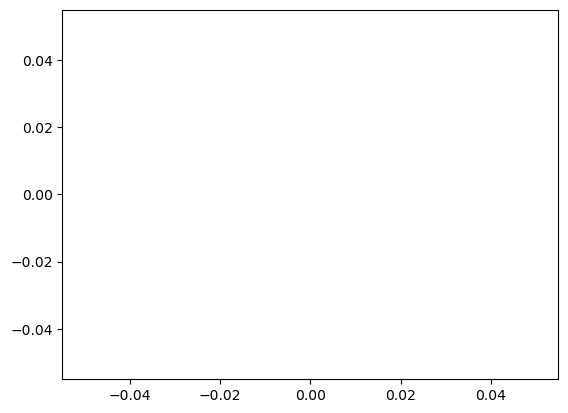

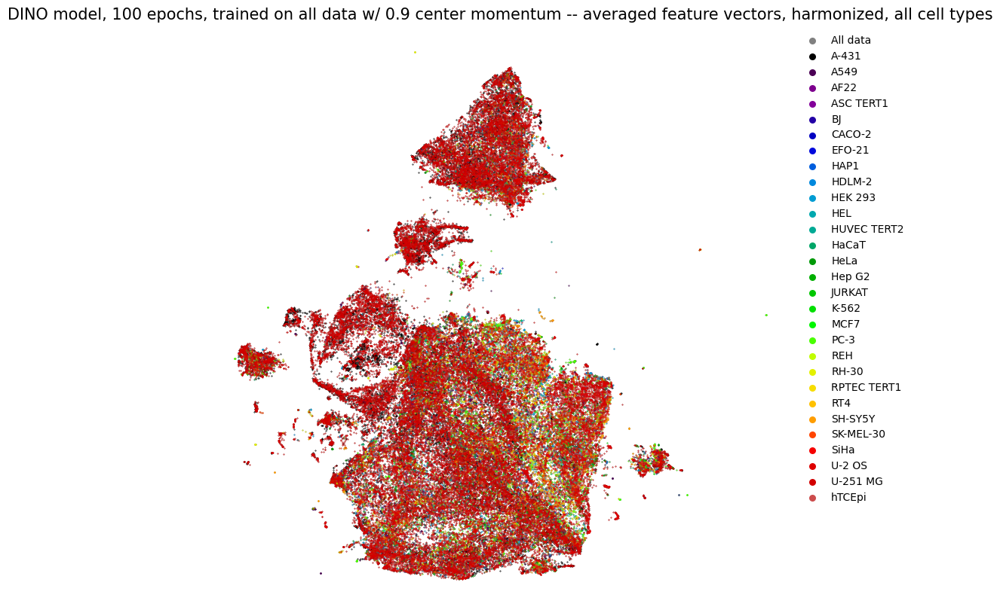

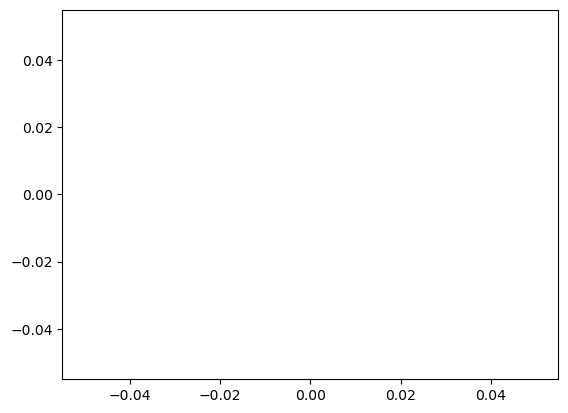

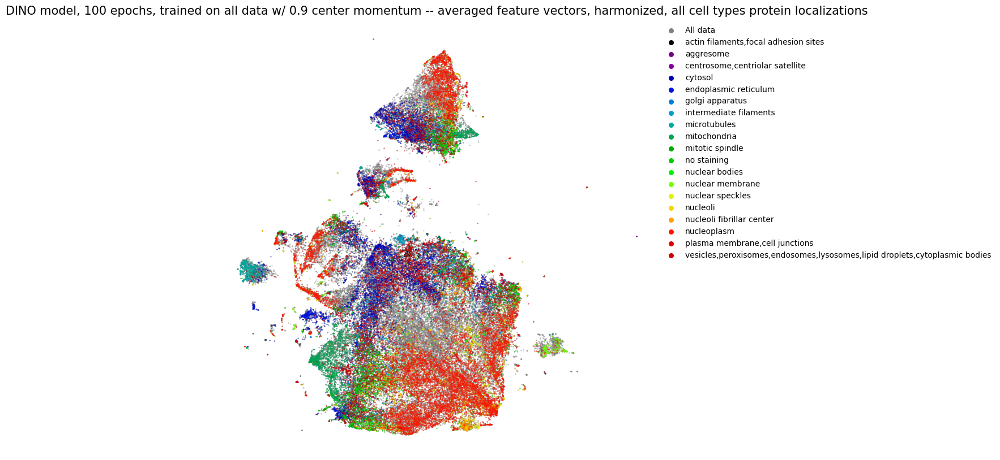

In [323]:
config_files = [
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_supervised_whole_image_model.yaml'
#     '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
    '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',    
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_U-2_OS_0.998_all_data.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_U-2_OS_0.998_all_data.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_pretrained.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_pretrained.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_tta.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_tta.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_sample_single_cells_large_batch_size.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_sample_single_cells_large_batch_size.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_whole_image_all_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_whole_image_combined.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_pretrained_whole_combined.yaml',
               ]
labels = [
#     'Supervised whole image',
#     'DINO model, 100 epochs, trained on all data w/ 0.9 center momentum -- Raw features',
#     'DINO model, 100 epochs, trained on all data w/ 0.9 center momentum -- UMAP trained on single cell per image',
    'DINO model, 100 epochs, trained on all data w/ 0.9 center momentum -- averaged feature vectors',
#     'DINO model, 100 epochs, trained on all data w/ 0.9 center momentum -- UMAP trained on average',
#     'DINO model, 62 epochs, trained on all data w/ 0.9 center momentum -- single cell per image -- no multilabel',
#     'DINO model, 62 epochs, trained on all data w/ 0.9 center momentum -- single cell per image',
#     'DINO model, 62 epochs, trained on all data w/ 0.9 center momentum -- averaged',
#     'DINO model, 62 epochs, trained on all data w/ 0.9 center momentum',    
#     'DINO model, trained on all data w/ 0.9 center momentum -- averaged per whole image',
#     'DINO model, trained on U-2 OS data w/ 0.998 center momentum',  
#     'DINO model, trained on U-2 OS data w/ 0.998 center momentum -- averaged per whole image',  
#     'DINO model, trained on ImageNet',
#     'DINO model, trained on ImageNet -- averaged per whole image',
#     '2nd place Kaggle competitor',
#     '2nd place Kaggle competitor -- averaged per whole image',
#     'sample single cells',
#     'sample single cells -- averaged per whole image',
#     'Whole image all channels',
#     'Whole image combined',
#     'DINO model, trained on ImageNet, whole image',
             ]

label_types = [
#     'whole_image',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',    
    'single_cells',
#     'single_cells',
#     'single_cells',    
#     'single_cells',    
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'whole_image',
#     'whole_image',
#     'whole_image',
              ]

feature_types = [
#     'full',
#     'first',
#     'average',
#     'full',
#     'first',
#     'average',
#     'full',
#     'first',
#     'average',
#     'average_umap',
    'average',
#     'average_umap',    
#     'full',    
#     'average',
#     'full',
#     'average',
#     'full',
#     'average',
#     'full',
#     'average',    
#     'full',
#     'full',
#     'full',
              ]

umap_labels = [
#     None,
#     None,
#     None,
    None,
#     None,
#     None,
#     'cell_lines',
#     'cell_lines',
#     'cell_lines',
    
]


results = []
for config_file, label, label_type, feature_type, umap_label in zip(config_files, labels, label_types, feature_types, umap_labels):
    print(f'Now analysing {label}')
#     protein_mantel_test = create_protein_hierarchy(config_file, label_type=label_type, apply_pca=True, label=label, feature_type=feature_type)
#     rnaseq_mantel_test, top_1_accuracy, top_5_accuracy = create_cell_comparison(config_file, apply_pca=True, label=label, feature_type=feature_type)
#     protein_mantel_test = create_protein_hierarchy(config_file, label_type=label_type, apply_pca=False, label=label, feature_type=feature_type)
#     rnaseq_mantel_test, top_1_accuracy, top_5_accuracy = create_cell_comparison(config_file, apply_pca=False, label=label, feature_type=feature_type)
    
    config = yaml.safe_load(open(config_file, "r"))
    df = pd.read_csv(config['embedding']['df_path'])
    df['website'] = df.file.str.contains('-').astype(int)    
    if feature_type=='full':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
        features_to_fit = features
        features_to_transform = features
        if umap_label == 'cell_lines':
            print('supervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform), labels=cell_lines.argmax(axis=1).numpy()) 
        else:
            print('unsupervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform)) 
                
        scaled_features = torch.Tensor(scaled_features)
        
    if feature_type=='first_no_multilabel':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
#         features = features[np.where(df[list(protein_to_num_single_cells.keys())].sum(axis=1) == 1)[0], :]
#         IDs = np.array(IDs)[np.where(df[list(protein_to_num_single_cells.keys())].sum(axis=1) == 1)[0]]
#         df = df.iloc[np.where(df[list(protein_to_num_single_cells.keys())].sum(axis=1) == 1)[0]]
        no_multilabel_indices = np.where(df[list(protein_to_num_single_cells.keys())].sum(axis=1) == 1)[0]
        IDs = np.array(IDs)[no_multilabel_indices]
        features = np.array(features)[no_multilabel_indices]
        df = df.iloc[no_multilabel_indices]
        first_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        first_features = first_df.first()[[f'f_{i}' for i in range(len(features[0]))]].values
        features_to_fit = torch.Tensor(first_features)
#         df = df.groupby('ID').first().reset_index()
        features_to_transform = features
        if umap_label == 'cell_lines':
            print('supervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform), labels=cell_lines.argmax(axis=1).numpy()) 
        else:
            print('unsupervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform)) 
            scaled_features = torch.Tensor(scaled_features)
        
    if feature_type=='first':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
        features = harmonize(features.numpy(), 
                                        df,
                                        batch_key = ['website'], 
                                        use_gpu=True,
                                        random_state=42,
                                        tol_harmony=1e-10,
                                        tol_clustering=1e-10,
                                        max_iter_clustering=400,
        )        
#         features = features[np.where(df[list(protein_to_num_single_cells.keys())].sum(axis=1) == 1)[0], :]
#         IDs = np.array(IDs)[np.where(df[list(protein_to_num_single_cells.keys())].sum(axis=1) == 1)[0]]
#         df = df.iloc[np.where(df[list(protein_to_num_single_cells.keys())].sum(axis=1) == 1)[0]]
        first_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        first_features = first_df.first()[[f'f_{i}' for i in range(len(features[0]))]].values
        features_to_fit = torch.Tensor(first_features)
#         df = df.groupby('ID').first().reset_index()
        features_to_transform = features
        if umap_label == 'cell_lines':
            print('supervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform), labels=cell_lines.argmax(axis=1).numpy()) 
        else:
            print('unsupervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform)) 
               
        umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform))  
        scaled_features = torch.Tensor(scaled_features)
        
    elif feature_type=='average_umap':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])
        features = harmonize(features.numpy(), 
                                        df,
                                        batch_key = ['website'], 
                                        use_gpu=True,
                                        random_state=42,
        )
        features = harmonize(features.numpy(), 
                                        df,
                                        batch_key = ['cell_type'], 
                                        use_gpu=True,
                                        random_state=42,
        )        
        mean_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        mean_features = mean_df.mean()[[f'f_{i}' for i in range(len(features[0]))]].values
        features_to_fit = torch.Tensor(mean_features)
        features_to_transform = features
        if umap_label == 'cell_lines':
            print('supervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform), labels=cell_lines.argmax(axis=1).numpy()) 
        else:
            print('unsupervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform)) 
            scaled_features = torch.Tensor(scaled_features)
                
    elif feature_type=='average':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path']) 
        
        mean_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        mean_features = mean_df.mean()[[f'f_{i}' for i in range(len(features[0]))]].values
        df = df.groupby('ID').first().reset_index()
        
        mean_features = harmonize(mean_features,
                                        df,
                                        batch_key = ['website'], 
                                        use_gpu=True,
                                        random_state=42
        )
        mean_features = harmonize(mean_features, 
                                        df,
                                        batch_key = ['cell_type'], 
                                        use_gpu=True,
                                        random_state=42
        )            
        features_to_fit = mean_features
        features_to_transform = mean_features
        if umap_label == 'cell_lines':
            print('supervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform), labels=cell_lines.argmax(axis=1).numpy()) 
        else:
            print('unsupervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform)) 
            scaled_features = torch.Tensor(scaled_features)
        
    plot_UMAP(df, ['website'], embedding,  f'{label}, harmonized, all cell types')
    

Now analysing DINO model, 100 epochs, trained on all data w/ 0.9 center momentum -- averaged feature vectors
Use GPU mode.
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
Reach convergence after 2 iteration(s).
Use GPU mode.
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
Reach convergence after 3 iteration(s).
unsupervised umap
[D] [12:15:52.651065] /project/cpp/src/umap/runner.cuh:107 n_neighbors=15
[D] [12:15:52.651800] /project/cpp/src/umap/runner.cuh:129 Calling knn graph run
[D] [12:15:52.762238] /project/cpp/src/umap/runner.cuh:135 Done. Calling fuzzy simplicial set
[D] [12:15:52.763742] /project/cpp/src/umap/fuzzy_simpl_set/naive.cuh:317 Smooth kNN Distances
[D] [12:15:52.763858] /project/cpp/src/umap/fuzzy_simpl_set/naive.cuh:319 sigmas = [ 63.8459, 24.8164, 80.6982, 82.7988, 69.9712, 33.5342, 20.6057, 58.2483, 17.4816, 9.76361, 13.2854, 53.5581, 77.2905,

/scr/mdoron/miniconda3/lib/python3.9/site-packages/scipy/optimize/_minpack_py.py:501: RuntimeWarning: divide by zero encountered in power
  return func(xdata, *params) - ydata


[D] [12:15:53.469903] /project/cpp/src/umap/fuzzy_simpl_set/naive.cuh:348 /project/cpp/src/umap/fuzzy_simpl_set/naive.cuh:348 
[D] [12:15:53.477185] /project/cpp/src/umap/runner.cuh:142 Done. Calling remove zeros
[D] [12:15:54.309759] /project/cpp/src/umap/simpl_set_embed/algo.cuh:347 /project/cpp/src/umap/simpl_set_embed/algo.cuh:347 
[D] [12:15:54.836960] /project/cpp/src/umap/runner.cuh:346 Running transform
[D] [12:15:54.837015] /project/cpp/src/umap/runner.cuh:348 Building KNN Graph
[D] [12:15:54.948204] /project/cpp/src/umap/runner.cuh:381 Smoothing KNN distances
[D] [12:15:54.948714] /project/cpp/src/umap/runner.cuh:413 Executing fuzzy simplicial set
[D] [12:15:54.950043] /project/cpp/src/umap/runner.cuh:442 Performing L1 normalization
[D] [12:15:54.950591] /project/cpp/src/umap/runner.cuh:478 n_epochs=866
[D] [12:15:54.951974] /project/cpp/src/umap/runner.cuh:501 Computing # of epochs for training each sample
[D] [12:15:54.952432] /project/cpp/src/umap/runner.cuh:508 Performing

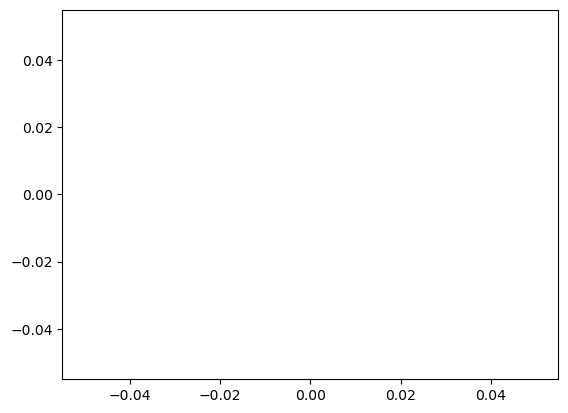

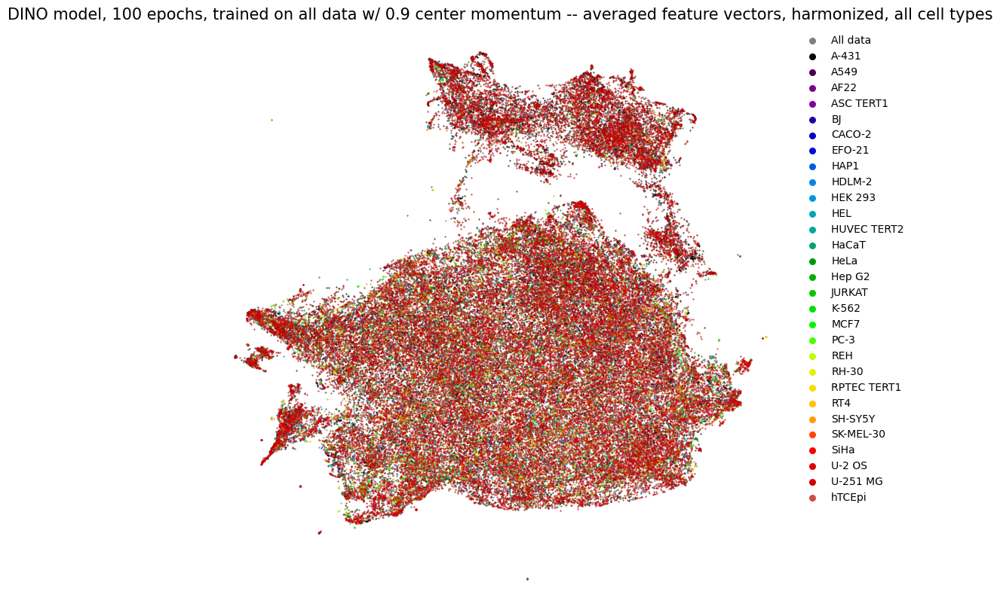

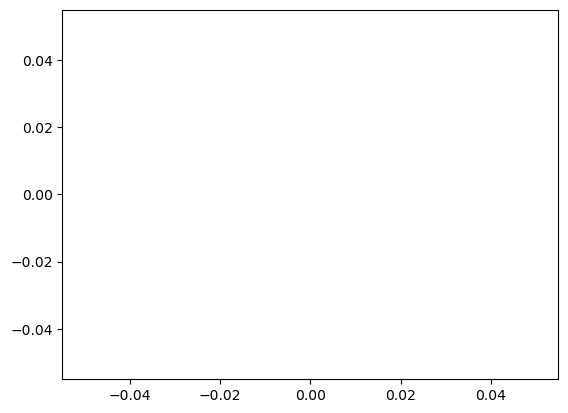

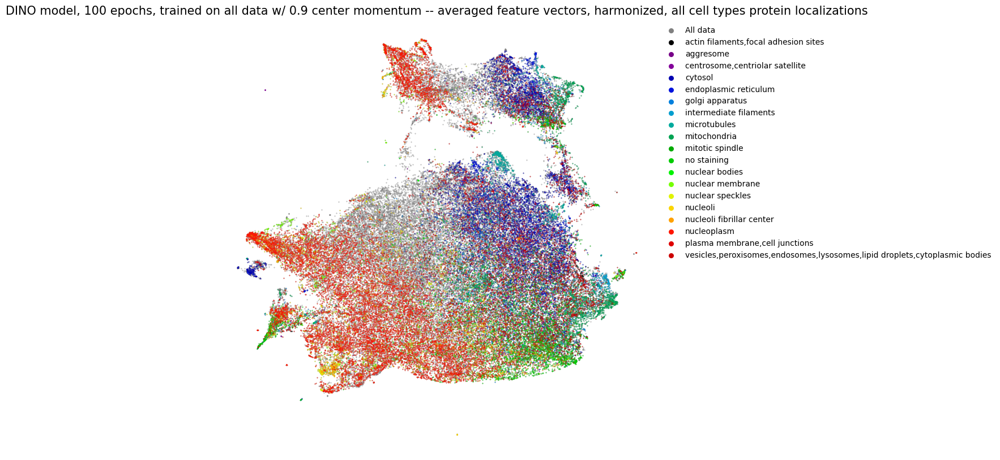

In [324]:
config_files = [
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_supervised_whole_image_model.yaml'
#     '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
    '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',    
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_U-2_OS_0.998_all_data.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_U-2_OS_0.998_all_data.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_pretrained.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_pretrained.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_tta.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_tta.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_sample_single_cells_large_batch_size.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_sample_single_cells_large_batch_size.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_whole_image_all_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_whole_image_combined.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_pretrained_whole_combined.yaml',
               ]
labels = [
#     'Supervised whole image',
#     'DINO model, 100 epochs, trained on all data w/ 0.9 center momentum -- Raw features',
#     'DINO model, 100 epochs, trained on all data w/ 0.9 center momentum -- UMAP trained on single cell per image',
    'DINO model, 100 epochs, trained on all data w/ 0.9 center momentum -- averaged feature vectors',
#     'DINO model, 100 epochs, trained on all data w/ 0.9 center momentum -- UMAP trained on average',
#     'DINO model, 62 epochs, trained on all data w/ 0.9 center momentum -- single cell per image -- no multilabel',
#     'DINO model, 62 epochs, trained on all data w/ 0.9 center momentum -- single cell per image',
#     'DINO model, 62 epochs, trained on all data w/ 0.9 center momentum -- averaged',
#     'DINO model, 62 epochs, trained on all data w/ 0.9 center momentum',    
#     'DINO model, trained on all data w/ 0.9 center momentum -- averaged per whole image',
#     'DINO model, trained on U-2 OS data w/ 0.998 center momentum',  
#     'DINO model, trained on U-2 OS data w/ 0.998 center momentum -- averaged per whole image',  
#     'DINO model, trained on ImageNet',
#     'DINO model, trained on ImageNet -- averaged per whole image',
#     '2nd place Kaggle competitor',
#     '2nd place Kaggle competitor -- averaged per whole image',
#     'sample single cells',
#     'sample single cells -- averaged per whole image',
#     'Whole image all channels',
#     'Whole image combined',
#     'DINO model, trained on ImageNet, whole image',
             ]

label_types = [
#     'whole_image',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',    
    'single_cells',
#     'single_cells',
#     'single_cells',    
#     'single_cells',    
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'whole_image',
#     'whole_image',
#     'whole_image',
              ]

feature_types = [
#     'full',
#     'first',
#     'average',
#     'full',
#     'first',
#     'average',
#     'full',
#     'first',
#     'average',
#     'average_umap',
    'average',
#     'average_umap',    
#     'full',    
#     'average',
#     'full',
#     'average',
#     'full',
#     'average',
#     'full',
#     'average',    
#     'full',
#     'full',
#     'full',
              ]

umap_labels = [
#     None,
#     None,
#     None,
    None,
#     None,
#     None,
#     'cell_lines',
#     'cell_lines',
#     'cell_lines',
    
]


results = []
for config_file, label, label_type, feature_type, umap_label in zip(config_files, labels, label_types, feature_types, umap_labels):
    print(f'Now analysing {label}')
#     protein_mantel_test = create_protein_hierarchy(config_file, label_type=label_type, apply_pca=True, label=label, feature_type=feature_type)
#     rnaseq_mantel_test, top_1_accuracy, top_5_accuracy = create_cell_comparison(config_file, apply_pca=True, label=label, feature_type=feature_type)
#     protein_mantel_test = create_protein_hierarchy(config_file, label_type=label_type, apply_pca=False, label=label, feature_type=feature_type)
#     rnaseq_mantel_test, top_1_accuracy, top_5_accuracy = create_cell_comparison(config_file, apply_pca=False, label=label, feature_type=feature_type)
    
    config = yaml.safe_load(open(config_file, "r"))
    df = pd.read_csv(config['embedding']['df_path'])
    df['website'] = df.file.str.contains('-').astype(int)    
    if feature_type=='full':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
        features_to_fit = features
        features_to_transform = features
        if umap_label == 'cell_lines':
            print('supervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform), labels=cell_lines.argmax(axis=1).numpy()) 
        else:
            print('unsupervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform)) 
                
        scaled_features = torch.Tensor(scaled_features)
        
    if feature_type=='first_no_multilabel':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
#         features = features[np.where(df[list(protein_to_num_single_cells.keys())].sum(axis=1) == 1)[0], :]
#         IDs = np.array(IDs)[np.where(df[list(protein_to_num_single_cells.keys())].sum(axis=1) == 1)[0]]
#         df = df.iloc[np.where(df[list(protein_to_num_single_cells.keys())].sum(axis=1) == 1)[0]]
        no_multilabel_indices = np.where(df[list(protein_to_num_single_cells.keys())].sum(axis=1) == 1)[0]
        IDs = np.array(IDs)[no_multilabel_indices]
        features = np.array(features)[no_multilabel_indices]
        df = df.iloc[no_multilabel_indices]
        first_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        first_features = first_df.first()[[f'f_{i}' for i in range(len(features[0]))]].values
        features_to_fit = torch.Tensor(first_features)
#         df = df.groupby('ID').first().reset_index()
        features_to_transform = features
        if umap_label == 'cell_lines':
            print('supervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform), labels=cell_lines.argmax(axis=1).numpy()) 
        else:
            print('unsupervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform)) 
            scaled_features = torch.Tensor(scaled_features)
        
    if feature_type=='first':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
        features = harmonize(features.numpy(), 
                                        df,
                                        batch_key = ['website'], 
                                        use_gpu=True,
                                        random_state=42
        )        
#         features = features[np.where(df[list(protein_to_num_single_cells.keys())].sum(axis=1) == 1)[0], :]
#         IDs = np.array(IDs)[np.where(df[list(protein_to_num_single_cells.keys())].sum(axis=1) == 1)[0]]
#         df = df.iloc[np.where(df[list(protein_to_num_single_cells.keys())].sum(axis=1) == 1)[0]]
        first_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        first_features = first_df.first()[[f'f_{i}' for i in range(len(features[0]))]].values
        features_to_fit = torch.Tensor(first_features)
#         df = df.groupby('ID').first().reset_index()
        features_to_transform = features
        if umap_label == 'cell_lines':
            print('supervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform), labels=cell_lines.argmax(axis=1).numpy()) 
        else:
            print('unsupervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform)) 
               
        umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform))  
        scaled_features = torch.Tensor(scaled_features)
        
    elif feature_type=='average_umap':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])
        features = harmonize(features.numpy(), 
                                        df,
                                        batch_key = ['website'], 
                                        use_gpu=True,
                                        random_state=42,
        )
        features = harmonize(features.numpy(), 
                                        df,
                                        batch_key = ['cell_type'], 
                                        use_gpu=True,
                                        random_state=42,
        )        
        mean_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        mean_features = mean_df.mean()[[f'f_{i}' for i in range(len(features[0]))]].values
        features_to_fit = torch.Tensor(mean_features)
        features_to_transform = features
        if umap_label == 'cell_lines':
            print('supervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform), labels=cell_lines.argmax(axis=1).numpy()) 
        else:
            print('unsupervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform)) 
            scaled_features = torch.Tensor(scaled_features)
                
    elif feature_type=='average':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path']) 
        
        mean_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        mean_features = mean_df.mean()[[f'f_{i}' for i in range(len(features[0]))]].values
        df = df.groupby('ID').first().reset_index()
        mean_features = harmonize(mean_features,
                                        df,
                                        batch_key = ['website'], 
                                        use_gpu=True,
                                        random_state=42
        )
        mean_features = harmonize(mean_features, 
                                        df,
                                        batch_key = ['cell_type'], 
                                        use_gpu=True,
                                        random_state=42
        )            
        features_to_fit = mean_features
        features_to_transform = mean_features
        if umap_label == 'cell_lines':
            print('supervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform), labels=cell_lines.argmax(axis=1).numpy()) 
        else:
            print('unsupervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform)) 
            scaled_features = torch.Tensor(scaled_features)
        
    plot_UMAP(df, ['cell_type'], embedding,  f'{label}, harmonized, all cell types')
    plot_UMAP(df, protein_to_num_single_cells, embedding,  f'{label}, harmonized, all cell types protein localizations')
    

Now analysing DINO model, 100 epochs, trained on all data w/ 0.9 center momentum -- averaged feature vectors
Use GPU mode.
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
Reach convergence after 2 iteration(s).
Use GPU mode.
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
Reach convergence after 3 iteration(s).
unsupervised umap
[D] [12:18:16.462090] /project/cpp/src/umap/runner.cuh:107 n_neighbors=15
[D] [12:18:16.463270] /project/cpp/src/umap/runner.cuh:129 Calling knn graph run
[D] [12:18:16.576433] /project/cpp/src/umap/runner.cuh:135 Done. Calling fuzzy simplicial set
[D] [12:18:16.578040] /project/cpp/src/umap/fuzzy_simpl_set/naive.cuh:317 Smooth kNN Distances
[D] [12:18:16.578191] /project/cpp/src/umap/fuzzy_simpl_set/naive.cuh:319 sigmas = [ 117.422, 102.137, 171.111, 126.664, 148.547, 61.5151, 54.7329, 78.6494, 42.4475, 20.2241, 41.8096, 76.8984, 75.5693,

/scr/mdoron/miniconda3/lib/python3.9/site-packages/scipy/optimize/_minpack_py.py:501: RuntimeWarning: divide by zero encountered in power
  return func(xdata, *params) - ydata


[D] [12:18:17.243584] /project/cpp/src/umap/fuzzy_simpl_set/naive.cuh:348 /project/cpp/src/umap/fuzzy_simpl_set/naive.cuh:348 
[D] [12:18:17.250984] /project/cpp/src/umap/runner.cuh:142 Done. Calling remove zeros
[D] [12:18:18.014327] /project/cpp/src/umap/simpl_set_embed/algo.cuh:347 /project/cpp/src/umap/simpl_set_embed/algo.cuh:347 
[D] [12:18:18.564656] /project/cpp/src/umap/runner.cuh:346 Running transform
[D] [12:18:18.564710] /project/cpp/src/umap/runner.cuh:348 Building KNN Graph
[D] [12:18:18.679237] /project/cpp/src/umap/runner.cuh:381 Smoothing KNN distances
[D] [12:18:18.679711] /project/cpp/src/umap/runner.cuh:413 Executing fuzzy simplicial set
[D] [12:18:18.681135] /project/cpp/src/umap/runner.cuh:442 Performing L1 normalization
[D] [12:18:18.681677] /project/cpp/src/umap/runner.cuh:478 n_epochs=866
[D] [12:18:18.682996] /project/cpp/src/umap/runner.cuh:501 Computing # of epochs for training each sample
[D] [12:18:18.683449] /project/cpp/src/umap/runner.cuh:508 Performing

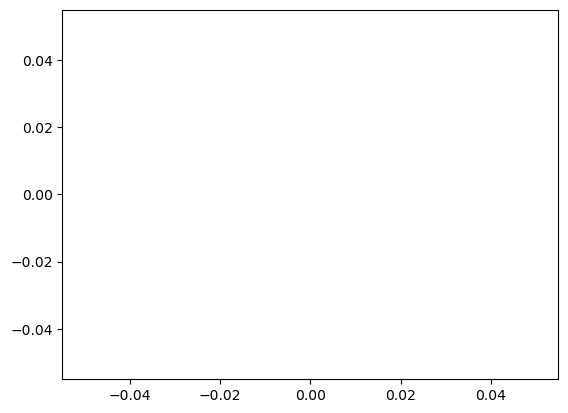

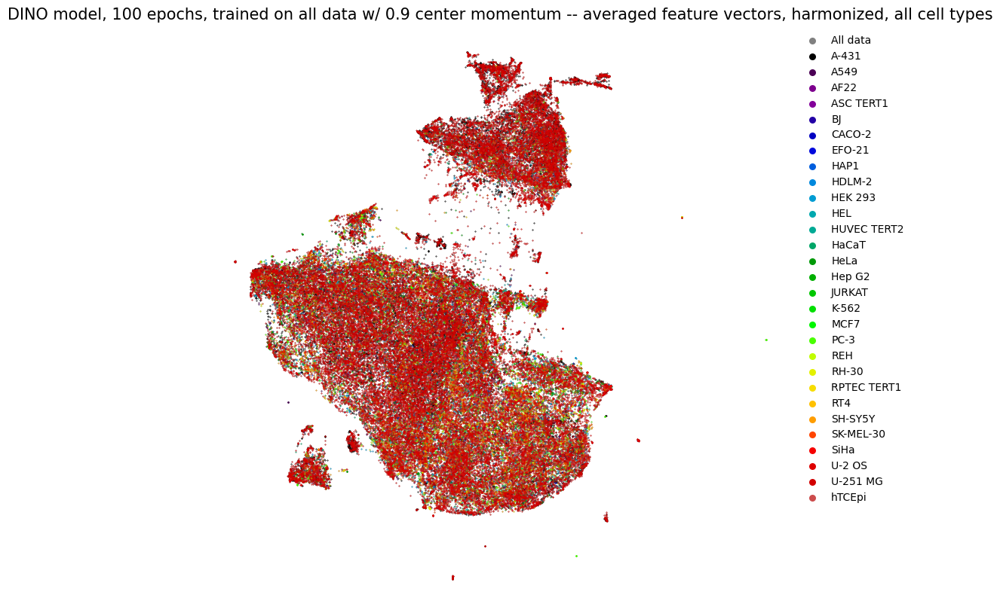

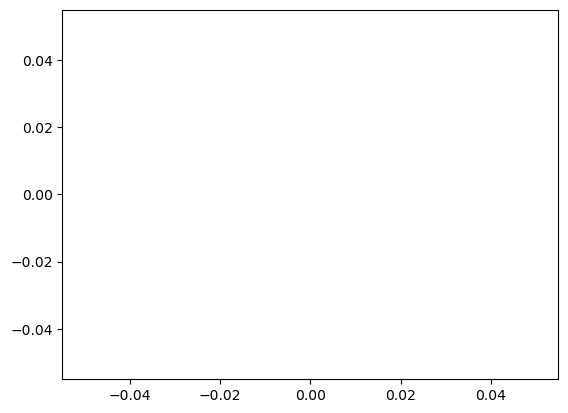

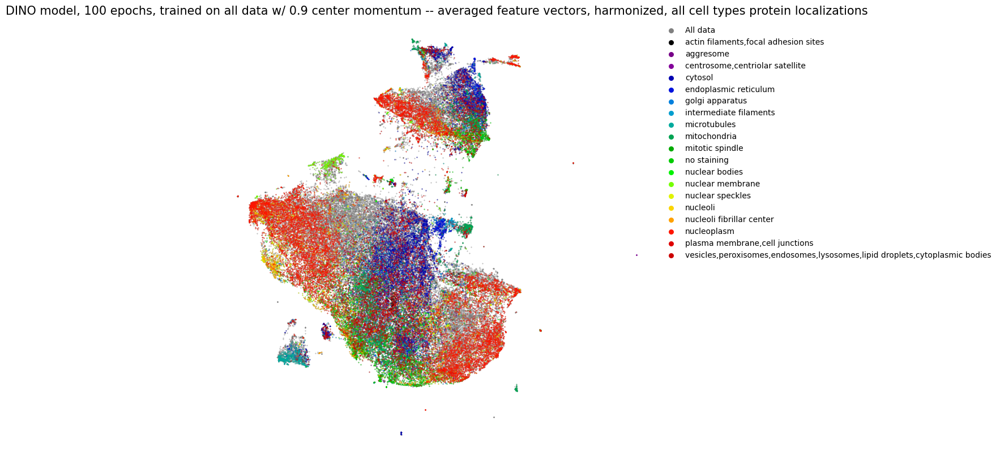

In [325]:
config_files = [
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_supervised_whole_image_model.yaml'
#     '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
    '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',    
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_U-2_OS_0.998_all_data.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_U-2_OS_0.998_all_data.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_pretrained.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_pretrained.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_tta.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_tta.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_sample_single_cells_large_batch_size.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_sample_single_cells_large_batch_size.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_whole_image_all_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_whole_image_combined.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_pretrained_whole_combined.yaml',
               ]
labels = [
#     'Supervised whole image',
#     'DINO model, 100 epochs, trained on all data w/ 0.9 center momentum -- Raw features',
#     'DINO model, 100 epochs, trained on all data w/ 0.9 center momentum -- UMAP trained on single cell per image',
    'DINO model, 100 epochs, trained on all data w/ 0.9 center momentum -- averaged feature vectors',
#     'DINO model, 100 epochs, trained on all data w/ 0.9 center momentum -- UMAP trained on average',
#     'DINO model, 62 epochs, trained on all data w/ 0.9 center momentum -- single cell per image -- no multilabel',
#     'DINO model, 62 epochs, trained on all data w/ 0.9 center momentum -- single cell per image',
#     'DINO model, 62 epochs, trained on all data w/ 0.9 center momentum -- averaged',
#     'DINO model, 62 epochs, trained on all data w/ 0.9 center momentum',    
#     'DINO model, trained on all data w/ 0.9 center momentum -- averaged per whole image',
#     'DINO model, trained on U-2 OS data w/ 0.998 center momentum',  
#     'DINO model, trained on U-2 OS data w/ 0.998 center momentum -- averaged per whole image',  
#     'DINO model, trained on ImageNet',
#     'DINO model, trained on ImageNet -- averaged per whole image',
#     '2nd place Kaggle competitor',
#     '2nd place Kaggle competitor -- averaged per whole image',
#     'sample single cells',
#     'sample single cells -- averaged per whole image',
#     'Whole image all channels',
#     'Whole image combined',
#     'DINO model, trained on ImageNet, whole image',
             ]

label_types = [
#     'whole_image',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',    
    'single_cells',
#     'single_cells',
#     'single_cells',    
#     'single_cells',    
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'whole_image',
#     'whole_image',
#     'whole_image',
              ]

feature_types = [
#     'full',
#     'first',
#     'average',
#     'full',
#     'first',
#     'average',
#     'full',
#     'first',
#     'average',
#     'average_umap',
    'average',
#     'average_umap',    
#     'full',    
#     'average',
#     'full',
#     'average',
#     'full',
#     'average',
#     'full',
#     'average',    
#     'full',
#     'full',
#     'full',
              ]

umap_labels = [
#     None,
#     None,
#     None,
    None,
#     None,
#     None,
#     'cell_lines',
#     'cell_lines',
#     'cell_lines',
    
]


results = []
for config_file, label, label_type, feature_type, umap_label in zip(config_files, labels, label_types, feature_types, umap_labels):
    print(f'Now analysing {label}')
#     protein_mantel_test = create_protein_hierarchy(config_file, label_type=label_type, apply_pca=True, label=label, feature_type=feature_type)
#     rnaseq_mantel_test, top_1_accuracy, top_5_accuracy = create_cell_comparison(config_file, apply_pca=True, label=label, feature_type=feature_type)
#     protein_mantel_test = create_protein_hierarchy(config_file, label_type=label_type, apply_pca=False, label=label, feature_type=feature_type)
#     rnaseq_mantel_test, top_1_accuracy, top_5_accuracy = create_cell_comparison(config_file, apply_pca=False, label=label, feature_type=feature_type)
    
    config = yaml.safe_load(open(config_file, "r"))
    df = pd.read_csv(config['embedding']['df_path'])
    df['website'] = df.file.str.contains('-').astype(int)    
    if feature_type=='full':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
        features_to_fit = features
        features_to_transform = features
        if umap_label == 'cell_lines':
            print('supervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform), labels=cell_lines.argmax(axis=1).numpy()) 
        else:
            print('unsupervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform)) 
                
        scaled_features = torch.Tensor(scaled_features)
        
    if feature_type=='first_no_multilabel':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
#         features = features[np.where(df[list(protein_to_num_single_cells.keys())].sum(axis=1) == 1)[0], :]
#         IDs = np.array(IDs)[np.where(df[list(protein_to_num_single_cells.keys())].sum(axis=1) == 1)[0]]
#         df = df.iloc[np.where(df[list(protein_to_num_single_cells.keys())].sum(axis=1) == 1)[0]]
        no_multilabel_indices = np.where(df[list(protein_to_num_single_cells.keys())].sum(axis=1) == 1)[0]
        IDs = np.array(IDs)[no_multilabel_indices]
        features = np.array(features)[no_multilabel_indices]
        df = df.iloc[no_multilabel_indices]
        first_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        first_features = first_df.first()[[f'f_{i}' for i in range(len(features[0]))]].values
        features_to_fit = torch.Tensor(first_features)
#         df = df.groupby('ID').first().reset_index()
        features_to_transform = features
        if umap_label == 'cell_lines':
            print('supervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform), labels=cell_lines.argmax(axis=1).numpy()) 
        else:
            print('unsupervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform)) 
            scaled_features = torch.Tensor(scaled_features)
        
    if feature_type=='first':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
        features = harmonize(features.numpy(), 
                                        df,
                                        batch_key = ['website'], 
                                        use_gpu=True,
                                        random_state=42
        )        
#         features = features[np.where(df[list(protein_to_num_single_cells.keys())].sum(axis=1) == 1)[0], :]
#         IDs = np.array(IDs)[np.where(df[list(protein_to_num_single_cells.keys())].sum(axis=1) == 1)[0]]
#         df = df.iloc[np.where(df[list(protein_to_num_single_cells.keys())].sum(axis=1) == 1)[0]]
        first_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        first_features = first_df.first()[[f'f_{i}' for i in range(len(features[0]))]].values
        features_to_fit = torch.Tensor(first_features)
#         df = df.groupby('ID').first().reset_index()
        features_to_transform = features
        if umap_label == 'cell_lines':
            print('supervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform), labels=cell_lines.argmax(axis=1).numpy()) 
        else:
            print('unsupervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform)) 
               
        umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform))  
        scaled_features = torch.Tensor(scaled_features)
        
    elif feature_type=='average_umap':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])
        features = harmonize(features.numpy(), 
                                        df,
                                        batch_key = ['website'], 
                                        use_gpu=True,
                                        random_state=42,
        )
        features = harmonize(features.numpy(), 
                                        df,
                                        batch_key = ['cell_type'], 
                                        use_gpu=True,
                                        random_state=42,
        )        
        mean_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        mean_features = mean_df.mean()[[f'f_{i}' for i in range(len(features[0]))]].values
        features_to_fit = torch.Tensor(mean_features)
        features_to_transform = features
        if umap_label == 'cell_lines':
            print('supervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform), labels=cell_lines.argmax(axis=1).numpy()) 
        else:
            print('unsupervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform)) 
            scaled_features = torch.Tensor(scaled_features)
                
    elif feature_type=='average':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path']) 
        
        mean_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        mean_features = mean_df.mean()[[f'f_{i}' for i in range(len(features[0]))]].values
        df = df.groupby('ID').first().reset_index()
        pca = decomposition.PCA(n_components=30)
        mean_features = pca.fit_transform(mean_features)
        
        mean_features = harmonize(mean_features,
                                        df,
                                        batch_key = ['website'], 
                                        use_gpu=True,
                                        random_state=42
        )
        mean_features = harmonize(mean_features, 
                                        df,
                                        batch_key = ['cell_type'], 
                                        use_gpu=True,
                                        random_state=42
        )            
        features_to_fit = mean_features
        features_to_transform = mean_features
        if umap_label == 'cell_lines':
            print('supervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform), labels=cell_lines.argmax(axis=1).numpy()) 
        else:
            print('unsupervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform)) 
            scaled_features = torch.Tensor(scaled_features)
        
    plot_UMAP(df, ['cell_type'], embedding,  f'{label}, harmonized, all cell types')
    plot_UMAP(df, protein_to_num_single_cells, embedding,  f'{label}, harmonized, all cell types protein localizations')
    

Now analysing DINO model, 100 epochs, trained on all data w/ 0.9 center momentum -- averaged feature vectors
Use GPU mode.
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
Reach convergence after 2 iteration(s).
Use GPU mode.
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
Reach convergence after 3 iteration(s).
unsupervised umap
[D] [12:21:04.486654] /project/cpp/src/umap/runner.cuh:107 n_neighbors=15
[D] [12:21:04.487487] /project/cpp/src/umap/runner.cuh:129 Calling knn graph run
[D] [12:21:04.649848] /project/cpp/src/umap/runner.cuh:135 Done. Calling fuzzy simplicial set
[D] [12:21:04.651277] /project/cpp/src/umap/fuzzy_simpl_set/naive.cuh:317 Smooth kNN Distances
[D] [12:21:04.651442] /project/cpp/src/umap/fuzzy_simpl_set/naive.cuh:319 sigmas = [ 167.015, 175.068, 217.862, 177.222, 178.956, 84.29, 85.2861, 109.23, 44.6733, 30.0215, 60.8582, 86.6807, 128.193, 13

/scr/mdoron/miniconda3/lib/python3.9/site-packages/scipy/optimize/_minpack_py.py:501: RuntimeWarning: divide by zero encountered in power
  return func(xdata, *params) - ydata


[D] [12:21:05.317445] /project/cpp/src/umap/fuzzy_simpl_set/naive.cuh:348 /project/cpp/src/umap/fuzzy_simpl_set/naive.cuh:348 
[D] [12:21:05.324439] /project/cpp/src/umap/runner.cuh:142 Done. Calling remove zeros
[D] [12:21:06.077374] /project/cpp/src/umap/simpl_set_embed/algo.cuh:347 /project/cpp/src/umap/simpl_set_embed/algo.cuh:347 
[D] [12:21:06.614576] /project/cpp/src/umap/runner.cuh:346 Running transform
[D] [12:21:06.614637] /project/cpp/src/umap/runner.cuh:348 Building KNN Graph
[D] [12:21:06.776607] /project/cpp/src/umap/runner.cuh:381 Smoothing KNN distances
[D] [12:21:06.777058] /project/cpp/src/umap/runner.cuh:413 Executing fuzzy simplicial set
[D] [12:21:06.778437] /project/cpp/src/umap/runner.cuh:442 Performing L1 normalization
[D] [12:21:06.779008] /project/cpp/src/umap/runner.cuh:478 n_epochs=866
[D] [12:21:06.781009] /project/cpp/src/umap/runner.cuh:501 Computing # of epochs for training each sample
[D] [12:21:06.781538] /project/cpp/src/umap/runner.cuh:508 Performing

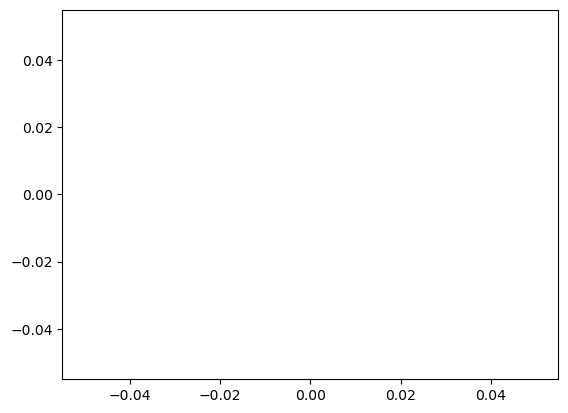

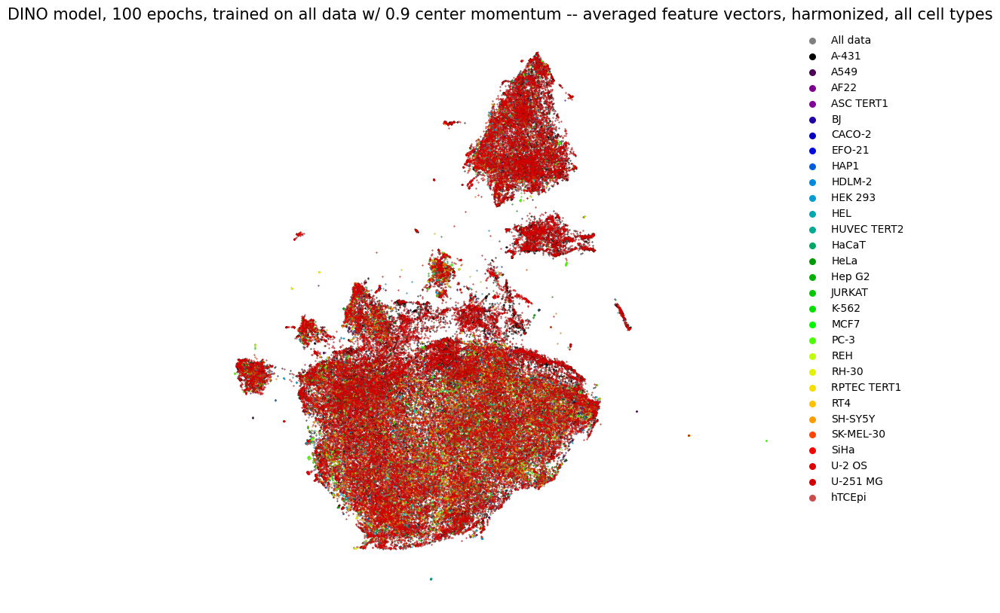

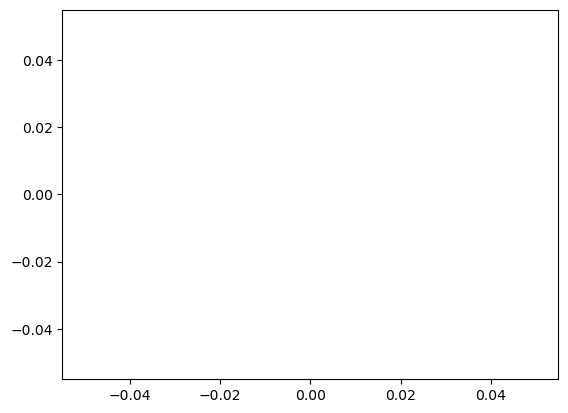

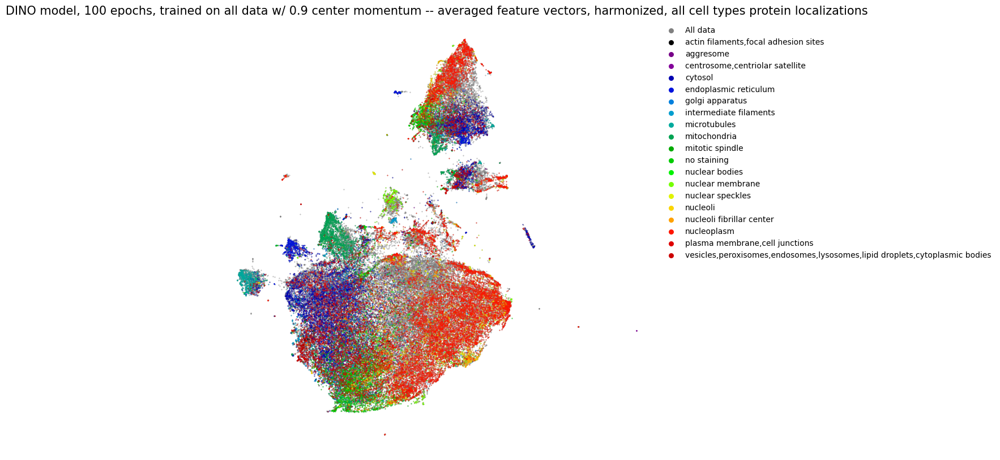

In [326]:
config_files = [
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_supervised_whole_image_model.yaml'
#     '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
    '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',    
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_U-2_OS_0.998_all_data.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_U-2_OS_0.998_all_data.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_pretrained.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_pretrained.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_tta.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_tta.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_sample_single_cells_large_batch_size.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_sample_single_cells_large_batch_size.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_whole_image_all_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_whole_image_combined.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_pretrained_whole_combined.yaml',
               ]
labels = [
#     'Supervised whole image',
#     'DINO model, 100 epochs, trained on all data w/ 0.9 center momentum -- Raw features',
#     'DINO model, 100 epochs, trained on all data w/ 0.9 center momentum -- UMAP trained on single cell per image',
    'DINO model, 100 epochs, trained on all data w/ 0.9 center momentum -- averaged feature vectors',
#     'DINO model, 100 epochs, trained on all data w/ 0.9 center momentum -- UMAP trained on average',
#     'DINO model, 62 epochs, trained on all data w/ 0.9 center momentum -- single cell per image -- no multilabel',
#     'DINO model, 62 epochs, trained on all data w/ 0.9 center momentum -- single cell per image',
#     'DINO model, 62 epochs, trained on all data w/ 0.9 center momentum -- averaged',
#     'DINO model, 62 epochs, trained on all data w/ 0.9 center momentum',    
#     'DINO model, trained on all data w/ 0.9 center momentum -- averaged per whole image',
#     'DINO model, trained on U-2 OS data w/ 0.998 center momentum',  
#     'DINO model, trained on U-2 OS data w/ 0.998 center momentum -- averaged per whole image',  
#     'DINO model, trained on ImageNet',
#     'DINO model, trained on ImageNet -- averaged per whole image',
#     '2nd place Kaggle competitor',
#     '2nd place Kaggle competitor -- averaged per whole image',
#     'sample single cells',
#     'sample single cells -- averaged per whole image',
#     'Whole image all channels',
#     'Whole image combined',
#     'DINO model, trained on ImageNet, whole image',
             ]

label_types = [
#     'whole_image',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',    
    'single_cells',
#     'single_cells',
#     'single_cells',    
#     'single_cells',    
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'whole_image',
#     'whole_image',
#     'whole_image',
              ]

feature_types = [
#     'full',
#     'first',
#     'average',
#     'full',
#     'first',
#     'average',
#     'full',
#     'first',
#     'average',
#     'average_umap',
    'average',
#     'average_umap',    
#     'full',    
#     'average',
#     'full',
#     'average',
#     'full',
#     'average',
#     'full',
#     'average',    
#     'full',
#     'full',
#     'full',
              ]

umap_labels = [
#     None,
#     None,
#     None,
    None,
#     None,
#     None,
#     'cell_lines',
#     'cell_lines',
#     'cell_lines',
    
]


results = []
for config_file, label, label_type, feature_type, umap_label in zip(config_files, labels, label_types, feature_types, umap_labels):
    print(f'Now analysing {label}')
#     protein_mantel_test = create_protein_hierarchy(config_file, label_type=label_type, apply_pca=True, label=label, feature_type=feature_type)
#     rnaseq_mantel_test, top_1_accuracy, top_5_accuracy = create_cell_comparison(config_file, apply_pca=True, label=label, feature_type=feature_type)
#     protein_mantel_test = create_protein_hierarchy(config_file, label_type=label_type, apply_pca=False, label=label, feature_type=feature_type)
#     rnaseq_mantel_test, top_1_accuracy, top_5_accuracy = create_cell_comparison(config_file, apply_pca=False, label=label, feature_type=feature_type)
    
    config = yaml.safe_load(open(config_file, "r"))
    df = pd.read_csv(config['embedding']['df_path'])
    df['website'] = df.file.str.contains('-').astype(int)    
    if feature_type=='full':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
        features_to_fit = features
        features_to_transform = features
        if umap_label == 'cell_lines':
            print('supervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform), labels=cell_lines.argmax(axis=1).numpy()) 
        else:
            print('unsupervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform)) 
                
        scaled_features = torch.Tensor(scaled_features)
        
    if feature_type=='first_no_multilabel':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
#         features = features[np.where(df[list(protein_to_num_single_cells.keys())].sum(axis=1) == 1)[0], :]
#         IDs = np.array(IDs)[np.where(df[list(protein_to_num_single_cells.keys())].sum(axis=1) == 1)[0]]
#         df = df.iloc[np.where(df[list(protein_to_num_single_cells.keys())].sum(axis=1) == 1)[0]]
        no_multilabel_indices = np.where(df[list(protein_to_num_single_cells.keys())].sum(axis=1) == 1)[0]
        IDs = np.array(IDs)[no_multilabel_indices]
        features = np.array(features)[no_multilabel_indices]
        df = df.iloc[no_multilabel_indices]
        first_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        first_features = first_df.first()[[f'f_{i}' for i in range(len(features[0]))]].values
        features_to_fit = torch.Tensor(first_features)
#         df = df.groupby('ID').first().reset_index()
        features_to_transform = features
        if umap_label == 'cell_lines':
            print('supervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform), labels=cell_lines.argmax(axis=1).numpy()) 
        else:
            print('unsupervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform)) 
            scaled_features = torch.Tensor(scaled_features)
        
    if feature_type=='first':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
        features = harmonize(features.numpy(), 
                                        df,
                                        batch_key = ['website'], 
                                        use_gpu=True,
                                        random_state=42
        )        
#         features = features[np.where(df[list(protein_to_num_single_cells.keys())].sum(axis=1) == 1)[0], :]
#         IDs = np.array(IDs)[np.where(df[list(protein_to_num_single_cells.keys())].sum(axis=1) == 1)[0]]
#         df = df.iloc[np.where(df[list(protein_to_num_single_cells.keys())].sum(axis=1) == 1)[0]]
        first_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        first_features = first_df.first()[[f'f_{i}' for i in range(len(features[0]))]].values
        features_to_fit = torch.Tensor(first_features)
#         df = df.groupby('ID').first().reset_index()
        features_to_transform = features
        if umap_label == 'cell_lines':
            print('supervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform), labels=cell_lines.argmax(axis=1).numpy()) 
        else:
            print('unsupervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform)) 
               
        umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform))  
        scaled_features = torch.Tensor(scaled_features)
        
    elif feature_type=='average_umap':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])
        features = harmonize(features.numpy(), 
                                        df,
                                        batch_key = ['website'], 
                                        use_gpu=True,
                                        random_state=42,
        )
        features = harmonize(features.numpy(), 
                                        df,
                                        batch_key = ['cell_type'], 
                                        use_gpu=True,
                                        random_state=42,
        )        
        mean_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        mean_features = mean_df.mean()[[f'f_{i}' for i in range(len(features[0]))]].values
        features_to_fit = torch.Tensor(mean_features)
        features_to_transform = features
        if umap_label == 'cell_lines':
            print('supervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform), labels=cell_lines.argmax(axis=1).numpy()) 
        else:
            print('unsupervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform)) 
            scaled_features = torch.Tensor(scaled_features)
                
    elif feature_type=='average':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path']) 
        
        mean_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        mean_features = mean_df.mean()[[f'f_{i}' for i in range(len(features[0]))]].values
        df = df.groupby('ID').first().reset_index()
        pca = decomposition.PCA(n_components=40)
        mean_features = pca.fit_transform(mean_features)
        
        mean_features = harmonize(mean_features,
                                        df,
                                        batch_key = ['website'], 
                                        use_gpu=True,
                                        random_state=42
        )
        mean_features = harmonize(mean_features, 
                                        df,
                                        batch_key = ['cell_type'], 
                                        use_gpu=True,
                                        random_state=42
        )            
        features_to_fit = mean_features
        features_to_transform = mean_features
        if umap_label == 'cell_lines':
            print('supervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform), labels=cell_lines.argmax(axis=1).numpy()) 
        else:
            print('unsupervised umap')
            umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_transform)) 
            scaled_features = torch.Tensor(scaled_features)
        
    plot_UMAP(df, ['cell_type'], embedding,  f'{label}, harmonized, all cell types')
    plot_UMAP(df, protein_to_num_single_cells, embedding,  f'{label}, harmonized, all cell types protein localizations')
    

Now analysing DINO model, 100 epochs, trained on all data w/ 0.9 center momentum -- UMAP trained on average
Use GPU mode.
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
Reach convergence after 5 iteration(s).


/scr/mdoron/miniconda3/lib/python3.9/site-packages/scipy/optimize/_minpack_py.py:501: RuntimeWarning: divide by zero encountered in power
  return func(xdata, *params) - ydata


[D] [14:15:09.593326] /project/python/_skbuild/linux-x86_64-3.9/cmake-build/cuml/common/logger.cxx:3188 Expected row ('C') major order, Converting data, this will result in additional memory utilization.
[D] [14:15:09.678900] /project/cpp/src/umap/runner.cuh:107 n_neighbors=15
[D] [14:15:09.680799] /project/cpp/src/umap/runner.cuh:129 Calling knn graph run
[D] [14:15:10.032249] /project/cpp/src/umap/runner.cuh:135 Done. Calling fuzzy simplicial set
[D] [14:15:10.045264] /project/cpp/src/umap/fuzzy_simpl_set/naive.cuh:317 Smooth kNN Distances
[D] [14:15:10.047566] /project/cpp/src/umap/fuzzy_simpl_set/naive.cuh:319 sigmas = [ 53.7202, 91.4858, 273.75, 251.365, 274.754, 324.943, 154.198, 39.9033, 72.9097, 53.8872, 229.996, 45.8459, 79.5469, 93.6978, 90.8394, 117.448, 125.315, 105.206, 259.427, 275.892, 383.547, 238.062, 244.518, 98.8291, 102.081 ]

[D] [14:15:10.047752] /project/cpp/src/umap/fuzzy_simpl_set/naive.cuh:321 rhos = [ 232.578, 565.594, 0.00384079, 0.0015802, 100.541, 0.069331

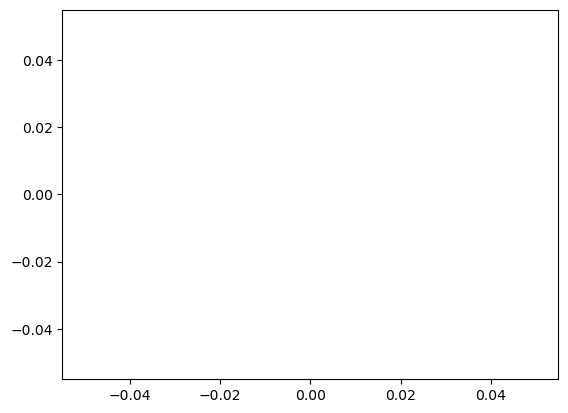

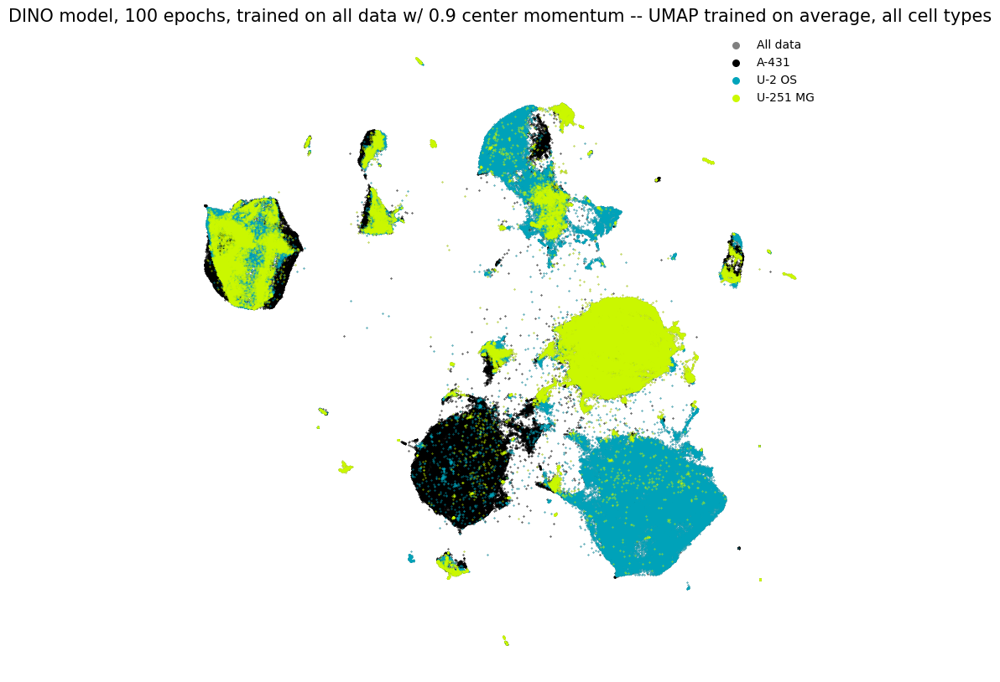

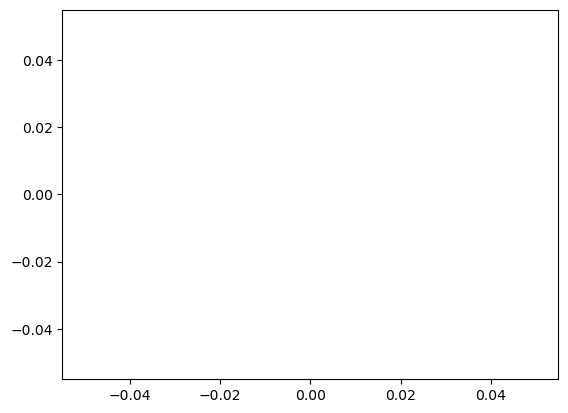

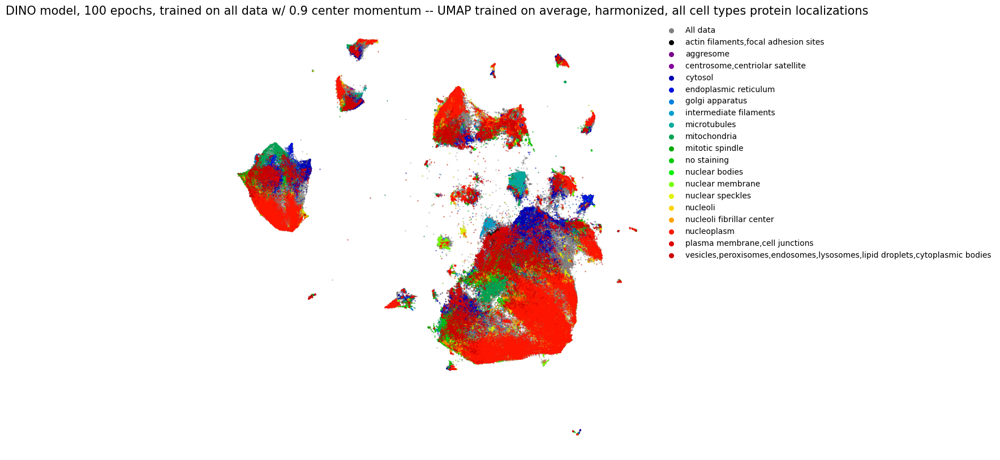

In [14]:
config_files = [
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_supervised_whole_image_model.yaml'
#     '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
    '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',    
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_U-2_OS_0.998_all_data.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_U-2_OS_0.998_all_data.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_pretrained.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_pretrained.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_tta.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_tta.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_sample_single_cells_large_batch_size.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_sample_single_cells_large_batch_size.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_whole_image_all_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_whole_image_combined.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_pretrained_whole_combined.yaml',
               ]
labels = [
#     'Supervised whole image',
#     'DINO model, 100 epochs, trained on all data w/ 0.9 center momentum -- Raw features',
#     'DINO model, 100 epochs, trained on all data w/ 0.9 center momentum -- UMAP trained on single cell per image',
    'DINO model, 100 epochs, trained on all data w/ 0.9 center momentum -- UMAP trained on average',
#     'DINO model, 62 epochs, trained on all data w/ 0.9 center momentum -- single cell per image -- no multilabel',
#     'DINO model, 62 epochs, trained on all data w/ 0.9 center momentum -- single cell per image',
#     'DINO model, 62 epochs, trained on all data w/ 0.9 center momentum -- averaged',
#     'DINO model, 62 epochs, trained on all data w/ 0.9 center momentum',    
#     'DINO model, trained on all data w/ 0.9 center momentum -- averaged per whole image',
#     'DINO model, trained on U-2 OS data w/ 0.998 center momentum',  
#     'DINO model, trained on U-2 OS data w/ 0.998 center momentum -- averaged per whole image',  
#     'DINO model, trained on ImageNet',
#     'DINO model, trained on ImageNet -- averaged per whole image',
#     '2nd place Kaggle competitor',
#     '2nd place Kaggle competitor -- averaged per whole image',
#     'sample single cells',
#     'sample single cells -- averaged per whole image',
#     'Whole image all channels',
#     'Whole image combined',
#     'DINO model, trained on ImageNet, whole image',
             ]

label_types = [
#     'whole_image',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',    
    'single_cells',
#     'single_cells',
#     'single_cells',    
#     'single_cells',    
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'whole_image',
#     'whole_image',
#     'whole_image',
              ]

feature_types = [
#     'full',
#     'first',
#     'average',
#     'full',
#     'first',
#     'average',
#     'full',
#     'first',
#     'average',
#     'average_umap',
    'average_umap',    
#     'full',    
#     'average',
#     'full',
#     'average',
#     'full',
#     'average',
#     'full',
#     'average',    
#     'full',
#     'full',
#     'full',
              ]

umap_labels = [
#     None,
#     None,
#     None,
    None,
#     None,
#     'cell_lines',
#     'cell_lines',
#     'cell_lines',
    
]


results = []
for config_file, label, label_type, feature_type, umap_label in zip(config_files, labels, label_types, feature_types, umap_labels):
    print(f'Now analysing {label}')
    config = yaml.safe_load(open(config_file, "r"))
    df = pd.read_csv(config['embedding']['df_path'])
    df['website'] = df.file.str.contains('-').astype(int)
    if feature_type=='average_umap':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])
        mat, cell_labels = get_col_matrix(df, ['cell_type'])
        indices = np.where(mat[:, np.argsort(mat.sum(axis=0))[-3:]])[0]
        df = df.iloc[indices]
        features = features[indices]
        protein_localizations = np.array(protein_localizations)[indices]
        cell_lines = np.array(cell_lines)[indices]
        IDs = np.array(IDs)[indices]
        
        pca = decomposition.PCA(n_components=100)
        reduced_features = pca.fit_transform(features)
        harmonized_features = harmonize(reduced_features, 
                                        df,
                                        batch_key = ['cell_type'], 
                                        use_gpu=True,
                                        random_state=42,
        )
        harmonized_mean_df = pd.DataFrame(pd.concat((pd.DataFrame(harmonized_features, columns=[f'f_{i}' for i in range(len(harmonized_features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        harmonized_mean_features = harmonized_mean_df.mean()[[f'f_{i}' for i in range(len(harmonized_features[0]))]].values
        mean_df = pd.DataFrame(pd.concat((pd.DataFrame(reduced_features, columns=[f'f_{i}' for i in range(len(reduced_features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        mean_features = mean_df.mean()[[f'f_{i}' for i in range(len(reduced_features[0]))]].values

        umap_reducer, features_mean, features_std, harmonized_embedding, scaled_features = get_embeddings(torch.Tensor(harmonized_mean_features), torch.Tensor(harmonized_features)) 
        umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(mean_features), torch.Tensor(reduced_features)) 
    
    plot_UMAP(df, ['cell_type'], embedding,  f'{label}, all cell types')
    plot_UMAP(df, protein_to_num_single_cells, harmonized_embedding,  f'{label}, harmonized, all cell types protein localizations')
    

Now analysing DINO model, 100 epochs, trained on all data w/ 0.9 center momentum -- UMAP trained on average
Use GPU mode.
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
Reach convergence after 4 iteration(s).


/scr/mdoron/miniconda3/lib/python3.9/site-packages/scipy/optimize/_minpack_py.py:501: RuntimeWarning: divide by zero encountered in power
  return func(xdata, *params) - ydata


[D] [18:12:41.050276] /project/python/_skbuild/linux-x86_64-3.9/cmake-build/cuml/common/logger.cxx:3188 Expected row ('C') major order, Converting data, this will result in additional memory utilization.
[D] [18:12:41.116249] /project/cpp/src/umap/runner.cuh:107 n_neighbors=15
[D] [18:12:41.117768] /project/cpp/src/umap/runner.cuh:129 Calling knn graph run
[D] [18:12:42.356051] /project/cpp/src/umap/runner.cuh:135 Done. Calling fuzzy simplicial set
[D] [18:12:42.388100] /project/cpp/src/umap/fuzzy_simpl_set/naive.cuh:317 Smooth kNN Distances
[D] [18:12:42.388275] /project/cpp/src/umap/fuzzy_simpl_set/naive.cuh:319 sigmas = [ 75.416, 148.214, 409.838, 376.279, 385.627, 434.16, 190.616, 159.952, 122.97, 77.3306, 294.369, 71.0254, 116.533, 151.428, 130.938, 215.745, 135.731, 136.363, 410.676, 439.74, 579.709, 345.445, 351.613, 127.935, 118.996 ]

[D] [18:12:42.388321] /project/cpp/src/umap/fuzzy_simpl_set/naive.cuh:321 rhos = [ 333.098, 739.773, 0.0073743, 0.00413285, 173.857, 0.178386, 6

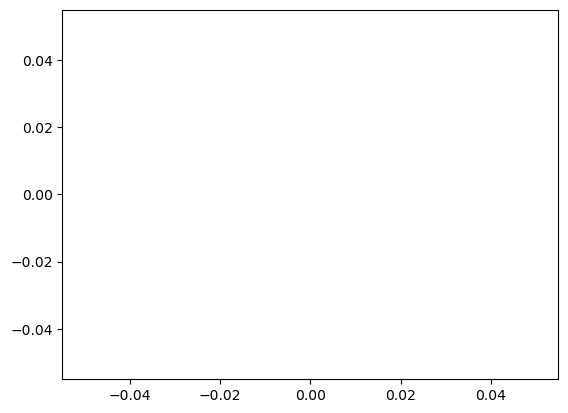

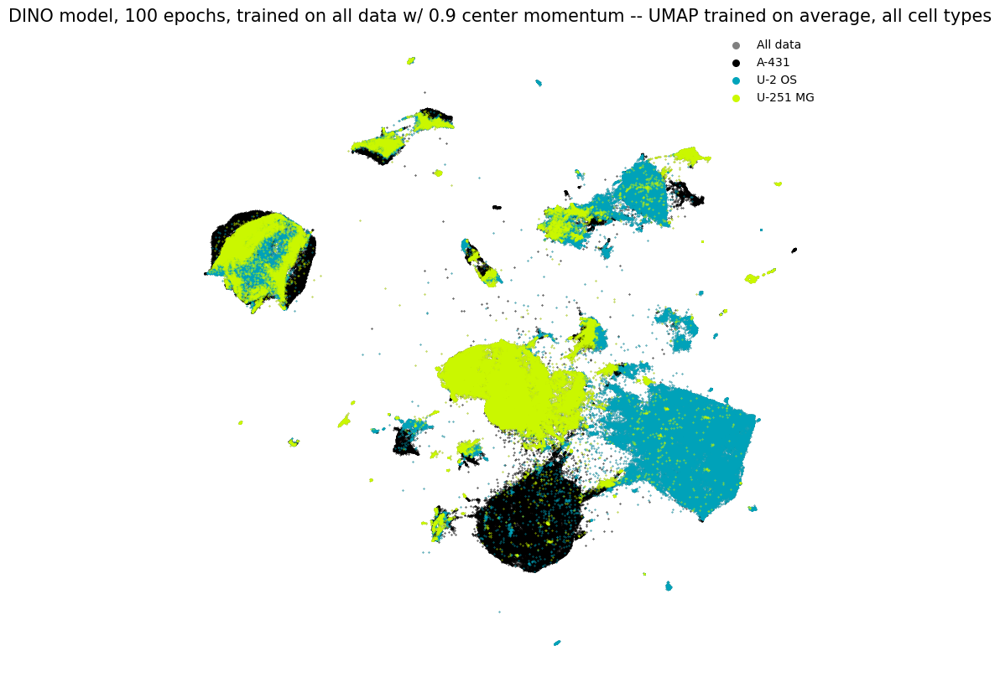

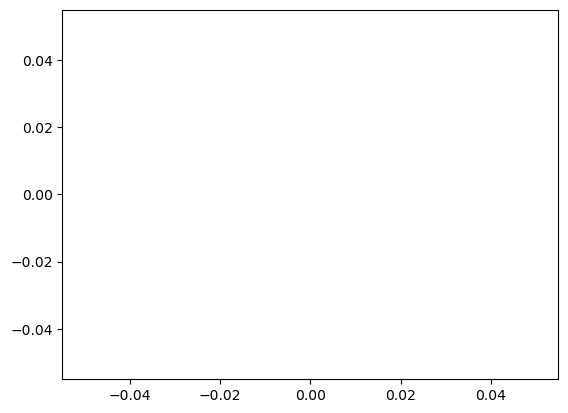

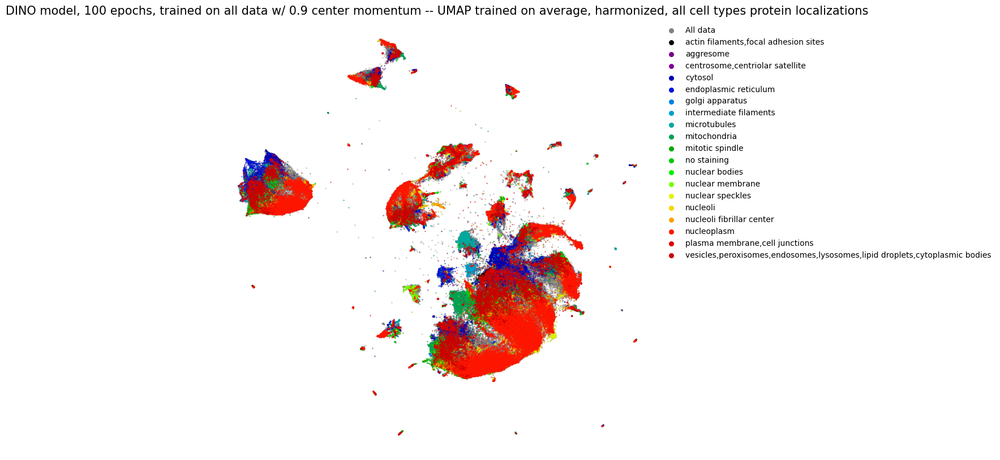

In [17]:
config_files = [
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_supervised_whole_image_model.yaml'
#     '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
    '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',    
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_U-2_OS_0.998_all_data.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_U-2_OS_0.998_all_data.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_pretrained.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_pretrained.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_tta.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_tta.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_sample_single_cells_large_batch_size.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_sample_single_cells_large_batch_size.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_whole_image_all_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_whole_image_combined.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_pretrained_whole_combined.yaml',
               ]
labels = [
#     'Supervised whole image',
#     'DINO model, 100 epochs, trained on all data w/ 0.9 center momentum -- Raw features',
#     'DINO model, 100 epochs, trained on all data w/ 0.9 center momentum -- UMAP trained on single cell per image',
    'DINO model, 100 epochs, trained on all data w/ 0.9 center momentum -- UMAP trained on average',
#     'DINO model, 62 epochs, trained on all data w/ 0.9 center momentum -- single cell per image -- no multilabel',
#     'DINO model, 62 epochs, trained on all data w/ 0.9 center momentum -- single cell per image',
#     'DINO model, 62 epochs, trained on all data w/ 0.9 center momentum -- averaged',
#     'DINO model, 62 epochs, trained on all data w/ 0.9 center momentum',    
#     'DINO model, trained on all data w/ 0.9 center momentum -- averaged per whole image',
#     'DINO model, trained on U-2 OS data w/ 0.998 center momentum',  
#     'DINO model, trained on U-2 OS data w/ 0.998 center momentum -- averaged per whole image',  
#     'DINO model, trained on ImageNet',
#     'DINO model, trained on ImageNet -- averaged per whole image',
#     '2nd place Kaggle competitor',
#     '2nd place Kaggle competitor -- averaged per whole image',
#     'sample single cells',
#     'sample single cells -- averaged per whole image',
#     'Whole image all channels',
#     'Whole image combined',
#     'DINO model, trained on ImageNet, whole image',
             ]

label_types = [
#     'whole_image',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',    
    'single_cells',
#     'single_cells',
#     'single_cells',    
#     'single_cells',    
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'whole_image',
#     'whole_image',
#     'whole_image',
              ]

feature_types = [
#     'full',
#     'first',
#     'average',
#     'full',
#     'first',
#     'average',
#     'full',
#     'first',
#     'average',
#     'average_umap',
    'average_umap',    
#     'full',    
#     'average',
#     'full',
#     'average',
#     'full',
#     'average',
#     'full',
#     'average',    
#     'full',
#     'full',
#     'full',
              ]

umap_labels = [
#     None,
#     None,
#     None,
    None,
#     None,
#     'cell_lines',
#     'cell_lines',
#     'cell_lines',
    
]


results = []
for config_file, label, label_type, feature_type, umap_label in zip(config_files, labels, label_types, feature_types, umap_labels):
    print(f'Now analysing {label}')
    config = yaml.safe_load(open(config_file, "r"))
    df = pd.read_csv(config['embedding']['df_path'])
    df['website'] = df.file.str.contains('-').astype(int)
    if feature_type=='average_umap':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])
        mat, cell_labels = get_col_matrix(df, ['cell_type'])
        indices = np.where(mat[:, np.argsort(mat.sum(axis=0))[-3:]])[0]
        df = df.iloc[indices]
        features = features[indices]
        protein_localizations = np.array(protein_localizations)[indices]
        cell_lines = np.array(cell_lines)[indices]
        IDs = np.array(IDs)[indices]
        reduced_features = features
        harmonized_features = harmonize(reduced_features.numpy(), 
                                        df,
                                        batch_key = ['cell_type'], 
                                        use_gpu=True,
                                        random_state=42,
        )
        harmonized_mean_df = pd.DataFrame(pd.concat((pd.DataFrame(harmonized_features, columns=[f'f_{i}' for i in range(len(harmonized_features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        harmonized_mean_features = harmonized_mean_df.mean()[[f'f_{i}' for i in range(len(harmonized_features[0]))]].values
        mean_df = pd.DataFrame(pd.concat((pd.DataFrame(reduced_features, columns=[f'f_{i}' for i in range(len(reduced_features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        mean_features = mean_df.mean()[[f'f_{i}' for i in range(len(reduced_features[0]))]].values

        umap_reducer, features_mean, features_std, harmonized_embedding, scaled_features = get_embeddings(torch.Tensor(harmonized_mean_features), torch.Tensor(harmonized_features)) 
        umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(mean_features), torch.Tensor(reduced_features)) 
        df['UMAP_1'] = embedding[:,0]
        df['UMAP_2'] = embedding[:,1]
        df.to_csv(f"{config['classification']['output_dir']}/{config['classification']['output_prefix']}/3_classes_embedding_{feature_type}.csv")
        df['UMAP_1'] = harmonized_embedding[:,0]
        df['UMAP_2'] = harmonized_embedding[:,1]
        df.to_csv(f"{config['classification']['output_dir']}/{config['classification']['output_prefix']}/3_classes_harmonized_embedding_{feature_type}.csv")
    
    plot_UMAP(df, ['cell_type'], embedding,  f'{label}, all cell types')
    plot_UMAP(df, protein_to_num_single_cells, harmonized_embedding,  f'{label}, harmonized, all cell types protein localizations')
    

(386265,)

Whole image all channels, protein CC knn, top-1: 0.42857142857142855, top-5: 0.7142857142857143
[1 0 1 0 1 1 0 0 1 1 0 1 1 0 0 1 0 1 0 0 0 0 0 1 0 1 1 1 0 0 0 1 0 0 0]


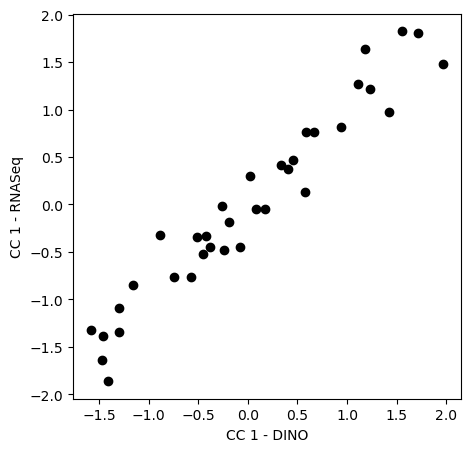

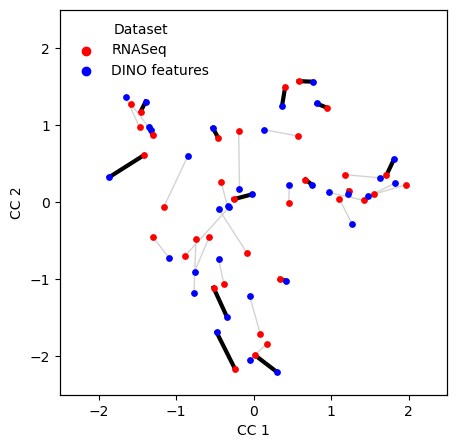

In [111]:
config = yaml.safe_load(open(config_file, "r"))
apply_pca = True

df = pd.read_csv(config['embedding']['df_path'])
if feature_type=='full':
    features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
elif feature_type=='average':
    features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
    mean_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                           pd.DataFrame(IDs, columns=['ID'])), 
                           axis=1)).groupby('ID')
    mean_features = mean_df.mean()[[f'f_{i}' for i in range(len(features[0]))]].values
    features = torch.Tensor(mean_features)
    df = df.groupby('ID').first().reset_index()
elif feature_type=='max':
    features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
    max_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                           pd.DataFrame(IDs, columns=['ID'])), 
                           axis=1)).groupby('ID')
    max_features = max_df.max()[[f'f_{i}' for i in range(len(features[0]))]].values
    features = torch.Tensor(max_features)
    df = df.groupby('ID').first().reset_index()

averaged_features, cell_columns = get_averaged_features(df, features, ['cell_type'], sort=True)
path_to_rna = '/scr/mdoron/Dino4Cells/rna_cellline.tsv'
rna = pd.read_csv(path_to_rna, delimiter="\t")
tpms = []
for cell_line in cell_columns:
    df = rna[rna["Cell line"] == cell_line]
    tpms.append(df.TPM.to_numpy())
tpms = np.array(tpms)
scaled_tpms, features_mean, features_std = scale(tpms)
scaled_averaged_features, features_mean, features_std = scale(averaged_features)

if apply_pca:
    pca = decomposition.PCA(n_components=10)
    scaled_tpms = pca.fit_transform(scaled_tpms)
    scaled_averaged_features = pca.fit_transform(scaled_averaged_features)

ca = CCA()
ca.fit(scaled_tpms, scaled_averaged_features)
X_c, Y_c = ca.transform(scaled_tpms, scaled_averaged_features)
cc_res = pd.DataFrame({"CCX_1":X_c[:, 0],
                       "CCY_1":Y_c[:, 0],
                       "CCX_2":X_c[:, 1],
                       "CCY_2":Y_c[:, 1],})

cc_distance_matrix = cdist(X_c, Y_c, metric='euclidean')

k = 1
top_1_accuracy = np.mean((np.tile(np.arange(cc_distance_matrix.shape[0])[:,np.newaxis], k) == np.argsort(cc_distance_matrix, axis=0)[0:k,:].T).sum(axis=1))
print(f"{label}, protein CC knn, top-1: {top_1_accuracy}, top-5: {top_5_accuracy}")    
k = 1

cc_results = (np.tile(np.arange(cc_distance_matrix.shape[0])[:,np.newaxis], k) == np.argsort(cc_distance_matrix, axis=0)[0:k,:].T).sum(axis=1)
print(cc_results)

fig, ax = plt.subplots(figsize=(5,5))
plt.scatter(X_c[:,0], Y_c[:, 0], color='black')
plt.xlabel('CC 1 - DINO')
plt.ylabel('CC 1 - RNASeq')

cc_res = pd.DataFrame({"CCX_1":X_c[:, 0],
                       "CCY_1":Y_c[:, 0],
                       "CCX_2":X_c[:, 1],
                       "CCY_2":Y_c[:, 1],})

fig, ax = plt.subplots(figsize=(5,5))
c = [cmap(i / len(cell_columns)) for i in range(len(cell_columns))]

for i in range(len(X_c)):
    if cc_results[i] == 1:
        linecolor = 'black'
        linewidth = 3
    else:
        linecolor = 'lightgrey'
        linewidth = 1
    plt.plot([X_c[i,0], Y_c[i, 0]], 
             [X_c[i,1], Y_c[i, 1]],
             c=linecolor,
             linewidth=linewidth, 
            zorder=1)
    plt.scatter(X_c[i,0], X_c[i, 1], color='red', marker='o', s=15, label='', zorder=2)
    plt.scatter(Y_c[i,0], Y_c[i, 1], color='blue', marker='o', s=15, zorder=2)
    plt.axis([-2.5,2.5,-2.5,2.5])

plt.xlabel('CC 1')
plt.ylabel('CC 2')

ax2 = ax.twinx()
ax2.scatter(np.NaN, np.NaN, color='red', label='RNASeq', marker = 'o')
ax2.scatter(np.NaN, np.NaN, color='blue', label='DINO features', marker = 'o')
ax2.get_yaxis().set_visible(False)
ax2.legend(frameon=False, loc='upper left', title='Dataset')

# ax3 = ax.twinx()
# for i in range(len(X_c)):
#     plt.scatter(np.NaN, np.NaN, color=c[i], marker='*', s=25, label=cell_columns[i])
# ax3.get_yaxis().set_visible(False)
# ax3.legend(frameon=False, loc='center right', title='Cell types', bbox_to_anchor=(1.75,0.5), fontsize=7.5, ncol=2)


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10567/10567 [00:00<00:00, 122413.32it/s]


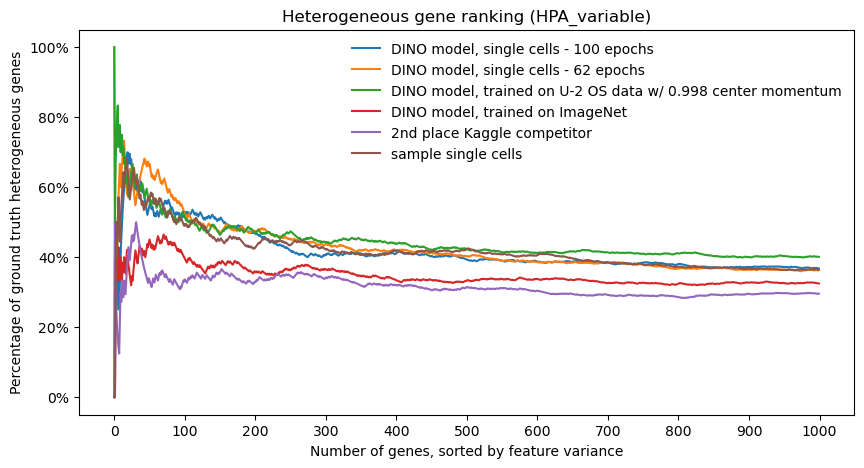

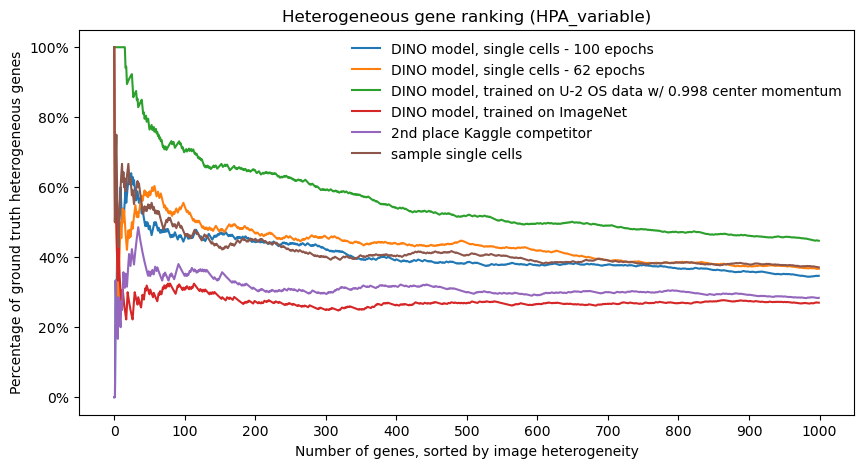

In [165]:
config_files = [
    '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
    '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
    '/scr/mdoron/Dino4Cells/configs/config_U-2_OS_0.998_all_data.yaml',
    '/scr/mdoron/Dino4Cells/configs/config_pretrained.yaml',
    '/scr/mdoron/Dino4Cells/configs/config_tta.yaml',
    '/scr/mdoron/Dino4Cells/configs/config_sample_single_cells_large_batch_size.yaml',
               ]

labels = [
    'DINO model, single cells - 100 epochs',
    'DINO model, single cells - 62 epochs',
    'DINO model, trained on U-2 OS data w/ 0.998 center momentum',      
    'DINO model, trained on ImageNet',
    '2nd place Kaggle competitor',
    'sample single cells',
             ]
condition = 'U-2 OS'
enrichments_conditioned_on_gene, enrichments_conditioned_on_image, merged_dfs, genes_sorted_conditioned_on_gene, genes_sorted_conditioned_on_image, sorted_metrics_conditioned_on_gene, sorted_metrics_conditioned_on_image, images_sorted_conditioned_on_image, average_precisions_condition_on_gene, average_precisions_condition_on_image = get_gene_heterogeneity_enrichement(config_files, heterogenous_type='HPA_variable', use_embedding=False, condition=condition)
plot_gene_heterogeneity_enrichement(labels, enrichments_conditioned_on_gene, enrichments_conditioned_on_image, heterogenous_type='HPA_variable')


In [170]:
average_precisions_condition_on_gene

[0.31289861834539817,
 0.31966212439846375,
 0.3338127930635066,
 0.2775073027879375,
 0.2680825316461191,
 0.3115422174075997]

In [ ]:
updated_result_df = pd.merge(pd.DataFrame(zip(average_precisions_condition_on_gene, labels), columns=['heterogeneity','title']),
         result_df,
         on='title',
        how='outer')
updated_result_df.to_csv('results_df.csv', index=False)

In [ ]:
list(zip(average_precisions_condition_on_gene, labels))

In [ ]:
config_file = '/scr/mdoron/Dino4Cells/configs/config_sample_single_cells.yaml'
config = yaml.safe_load(open(config_file, "r"))
df = pd.read_csv(config['embedding']['df_path'])
whole_image_df = pd.read_csv('/scr/mdoron/Dino4Cells/data/whole_images.csv')
features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
grouped_df = pd.concat((pd.DataFrame(features.numpy(), columns=[f'{f}' for f in range(len(features[0]))]),
           pd.DataFrame(IDs, columns=['ID'])),
          axis=1).groupby('ID').mean()
averaged_features = grouped_df[[f'{f}' for f in range(len(features[0]))]].values
averaged_IDs = np.array(grouped_df.index)
averaged_protein = torch.Tensor(pd.merge(pd.DataFrame(averaged_IDs, columns=['ID']),
        whole_image_df.drop_duplicates(),
        on='ID',
        how='left')[['ID'] + (list(protein_to_num_full.keys()))].drop_duplicates()[(list(protein_to_num_full.keys()))].values.astype(int))
averaged_cell_lines = pd.merge(pd.DataFrame(averaged_IDs, columns=['ID']),
        whole_image_df.drop_duplicates(),
        on='ID',
        how='left')[['cell_type']].values[:,0]
        
mapping_dict = protein_to_num_full
target_labels = sorted(list(mapping_dict.keys()))

mapping = np.arange(28)
for ind, p in enumerate(list(mapping_dict.keys())):
    mapping[ind] = target_labels.index(p)

for ind, p in enumerate(np.copy(mapping)):
    mapping[p] = ind
    
torch.save((averaged_features, averaged_protein[:,mapping], averaged_cell_lines, averaged_IDs),
           f"/scr/mdoron/Dino4Cells/results/{config['classification']['output_prefix']}/averaged_whole_features.pth"
          )
print(f"/scr/mdoron/Dino4Cells/results/{config['classification']['output_prefix']}/averaged_whole_features.pth")

In [ ]:
config = yaml.safe_load(open(config_file, "r"))
df = pd.read_csv(config['embedding']['df_path'])
whole_image_df = pd.read_csv('/scr/mdoron/Dino4Cells/data/whole_images.csv')
features, IDs, impaths = torch.load(config['classification']['averaged_test_path'])   
grouped_df = pd.concat((pd.DataFrame(features.numpy(), columns=[f'{f}' for f in range(len(features[0]))]),
                        pd.DataFrame(IDs, columns=['ID']),
                        pd.DataFrame(impaths, columns=['impath'])),
                       axis=1).groupby('ID')
averaged_features = torch.Tensor(grouped_df.mean()[[f'{f}' for f in range(len(features[0]))]].values)
averaged_impaths = grouped_df.first()['impath'].values
averaged_IDs = np.array(grouped_df.mean().index)

output_path = f"/scr/mdoron/Dino4Cells/results/{config['classification']['output_prefix']}/averaged_whole_test_features.pth"
torch.save((averaged_features, averaged_IDs, averaged_impaths), output_path)
print(output_path)


In [ ]:
averaged_impaths

In [ ]:
# predictions = pd.read_csv('/scr/mdoron/Dino4Cells/results/FAIR_whole_image_all_channels//submission_whole.csv')['Predicted'].values
predictions = pd.read_csv('/scr/mdoron/Dino4Cells/results/FAIR_whole_image_combined/submission_whole.csv')['Predicted'].values
predictions = pd.read_csv('/scr/mdoron/Dino4Cells/results/pretrained_sc/submission_whole.csv')['Predicted'].values
numerical_predictions = []
for p in predictions:
    if pd.isnull(p) == False:
        numerical_predictions.extend(p.split(' '))

numerical_predictions = np.array(numerical_predictions).astype(int)
np.argsort(np.histogram(numerical_predictions, bins=np.arange(28))[0])


In [ ]:
p = torch.load('/scr/mdoron/Dino4Cells/results/FAIR_whole_image_combined/all_targets.pth')
np.argsort(torch.sigmoid(torch.stack(p))[:,:].mean(axis=0))


In [ ]:
len(p)

In [ ]:
p = torch.load('/scr/mdoron/Dino4Cells/results/FAIR_whole_image_all_channels/all_targets.pth')
np.argsort(torch.sigmoid(torch.stack(p))[:,:].mean(axis=0))


In [ ]:
len(p)

In [ ]:
np.argsort(torch.sigmoid(torch.stack(p))[:,:].mean(axis=0))


In [ ]:
a,b,c,d = torch.load('/scr/mdoron/Dino4Cells/models/FAIR_whole_image_all_channels//valid_features.pth')
a1,b1,c1,d1 = torch.load('/scr/mdoron/Dino4Cells/models/pretrained_sc/averaged_valid_features.pth')
a2,b2,c2,d2 = torch.load('/scr/mdoron/Dino4Cells/models/FAIR_whole_image_combined/valid_features.pth')
# mapping_dict = protein_to_num_full
# target_labels = sorted(list(mapping_dict.keys()))

# mapping = np.arange(28)
# for ind, p in enumerate(list(mapping_dict.keys())):
#     mapping[ind] = target_labels.index(p)

# for ind, p in enumerate(np.copy(mapping)):
#     mapping[p] = ind

plt.plot((b).float()[:,:].mean(axis=0), color='black')
plt.plot((b1).float()[:,:].mean(axis=0), color='red')
plt.plot((b2).float()[:,:].mean(axis=0), color='blue')
# plt.plot(averaged_protein.mean(axis=0), color='red')
# plt.plot(averaged_protein[:,mapping].mean(axis=0), color='blue')


In [ ]:
a.shape

In [ ]:
config_file = '/scr/mdoron/Dino4Cells/configs/config_pretrained.yaml'
config = yaml.safe_load(open(config_file, "r"))
df = pd.read_csv(config['embedding']['df_path'])
whole_image_df = pd.read_csv('/scr/mdoron/Dino4Cells/data/whole_images.csv')
features, IDs, impaths = torch.load(config['classification']['averaged_test_path'])   
grouped_df = pd.concat((pd.DataFrame(features.numpy(), columns=[f'{f}' for f in range(len(features[0]))]),
                        pd.DataFrame(IDs, columns=['ID']),
                        pd.DataFrame(impaths, columns=['impath'])),
                       axis=1).groupby('ID')
averaged_features = torch.Tensor(grouped_df.mean()[[f'{f}' for f in range(len(features[0]))]].values)
averaged_impaths = grouped_df.first()['impath'].values
averaged_IDs = np.array(grouped_df.mean().index)

output_path = f"/scr/mdoron/Dino4Cells/results/{config['classification']['output_prefix']}/averaged_whole_test_features.pth"
torch.save((averaged_features, averaged_IDs, averaged_impaths), output_path)
print(output_path)


In [ ]:
grouped_df

In [ ]:
pd.merge(pd.DataFrame(averaged_IDs, columns=['ID']),
        whole_image_df.drop_duplicates(),
        on='ID',
        how='left')[sorted(list(protein_to_num_full.keys()))].shape

In [ ]:
config_files = [
    '/scr/mdoron/Dino4Cells/configs/config_bestfitting_whole.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_U-2_OS_0.998_all_data.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_U-2_OS_0.998_all_data.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_pretrained.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_pretrained.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_tta.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_tta.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_sample_single_cells_large_batch_size.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_sample_single_cells_large_batch_size.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_whole_image_all_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_whole_image_combined.yaml',
               ]
labels = [
    'DINO model, trained on ImageNet, whole image',
#     'DINO model, trained on all data w/ 0.9 center momentum',
#     'DINO model, trained on all data w/ 0.9 center momentum -- averaged per whole image',
#     'DINO model, trained on U-2 OS data w/ 0.998 center momentum',  
#     'DINO model, trained on U-2 OS data w/ 0.998 center momentum -- averaged per whole image',  
#     'DINO model, trained on ImageNet',
#     'DINO model, trained on ImageNet -- averaged per whole image',
#     '2nd place Kaggle competitor',
#     '2nd place Kaggle competitor -- averaged per whole image',
#     'sample single cells',
#     'sample single cells -- averaged per whole image',
#     'Whole image all channels',
#     'Whole image combined',
             ]

label_types = [
    'whole_image',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'whole_image',
#     'whole_image',
              ]

feature_types = [
    'full',
#     'full',
#     'average',
#     'full',
#     'average',
#     'full',
#     'average',
#     'full',
#     'average',
#     'full',
#     'average',    
#     'full',
#     'full',
              ]

results = []
for config_file, label, label_type, feature_type in zip(config_files, labels, label_types, feature_types):
    print(f'Now analysing {label}')
    
    config = yaml.safe_load(open(config_file, "r"))
    df = pd.read_csv(config['embedding']['df_path'])
    if feature_type=='full':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
    elif feature_type=='average':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
        mean_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        mean_features = mean_df.mean()[[f'f_{i}' for i in range(len(features[0]))]].values
        features = torch.Tensor(mean_features)
        df = df.groupby('ID').first().reset_index()
        features = torch.Tensor(features)
        df = df.groupby('ID').first().reset_index()
    umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features), torch.Tensor(features))  
    scaled_features = torch.Tensor(scaled_features)
    plot_UMAP(df, ['cell_type'], embedding, f'{label} - Cell line')
    plot_UMAP(df, protein_to_num_full, embedding, f'{label} - Protein localization')
    protein_mantel_test = create_protein_hierarchy(config_file, label_type=label_type, apply_pca=True, label=label, feature_type=feature_type)
    rnaseq_mantel_test, top_1_accuracy, top_5_accuracy = create_cell_comparison(config_file, apply_pca=True, label=label, feature_type=feature_type)
#     plot_UMAP(df, protein_to_num_single_cells, embedding, f'{label} - Protein localization')
#     results.append((protein_mantel_test, rnaseq_mantel_test, top_1_accuracy, top_5_accuracy))
    
# result_df = pd.DataFrame(np.concatenate((np.array(labels)[:,np.newaxis], (list(np.array(results)))), axis=1), 
#              columns=['title','protein hierarchy','rnaseq similarity','CC knn top-1', 'CC knn top-5'])
# result_df.to_csv('results_df.csv', index=False)

In [ ]:
updated_result_df = pd.merge(pd.DataFrame(zip(average_precisions_condition_on_gene, labels), columns=['heterogeneity','title']),
         result_df,
         on='title',
        how='outer')
updated_result_df.to_csv('results_df.csv', index=False)

In [ ]:
config_file = '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml'
config = yaml.safe_load(open(config_file, "r"))

features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
single_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                       pd.DataFrame(IDs, columns=['ID'])), 
                       axis=1)).groupby('ID')
single_features = single_df.first()[[f'f_{i}' for i in range(len(features[0]))]].values
single_features = torch.Tensor(single_features)


In [ ]:
config_file = '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml'
condition = 'U-2 OS'
use_embedding = False
granularity = 'image'
heterogenous_type = 'HPA_variable'

config = yaml.safe_load(open(config_file, "r"))
df = pd.read_csv(config['embedding']['df_path'])    
heterogeneity_df = get_heterogeneity_df(config_file)
merged_df = pd.merge(heterogeneity_df, df, on='ID', how='right').drop_duplicates()
merged_df.loc[pd.isnull(merged_df['Gene']),'Gene'] = ''
merged_df = merged_df.reset_index()
merged_df['original_index'] = merged_df.index.values
merged_df['cell_type'] = merged_df.cell_type_x
original_indices = merged_df.original_index.values
gene_to_ind = merged_df[['Gene','original_index']].groupby('Gene').groups
gene_to_ind = {k : original_indices[gene_to_ind[k]] for k in gene_to_ind.keys()}
merged_df[pd.isnull(merged_df.Gene)].Gene = ''
features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
protein_localizations = torch.stack(protein_localizations)
if condition == 'U-2 OS':
    features = features[np.where(merged_df.cell_type == 'U-2 OS')[0]]
    merged_df = merged_df[merged_df.cell_type == 'U-2 OS'].reset_index()
else:
    merged_df = merged_df.reset_index()

if use_embedding:
    umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features), torch.Tensor(features))  
    scaled_features = embedding
else:
    scaled_features, features_mean, features_std = scale(features)
    scaled_features = scaled_features.numpy()

indices = merged_df.index.values
merged_df['original_index'] = merged_df.index.values

if granularity == 'gene':
    mean_stds, sorted_genes = get_heterogeneousity_per_gene(merged_df, scaled_features, indices, metric='std', verbose=False)
elif granularity == 'image':
    mean_stds, sorted_images = get_heterogeneousity_per_whole_image(merged_df, scaled_features, indices, metric='std', verbose=False)

metric = mean_stds
sorted_distances = np.array(metric)[np.argsort(metric)[::-1]]
if granularity == 'gene':
    genes_sorted = np.array(sorted_genes)[np.argsort(metric)[::-1]]
    enrichment_raw = pd.DataFrame(genes_sorted)[0].isin(merged_df[merged_df[heterogenous_type] == True].Gene.unique()).values
    enrichment = []
    for ind in tqdm(range(1, len(genes_sorted), 1)):
        enrichment.append(enrichment_raw[:ind].mean())    
    images_sorted = None
    sorted_distances_per_image = None
    sorted_distances_per_gene = sorted_distances
elif granularity == 'image':
    images_sorted = np.array(sorted_images)[np.argsort(metric)[::-1]]
    merged_df['image_rank'] = merged_df.ID.map(dict(zip(images_sorted, range(len(images_sorted)))))
    merged_df['image_score'] = merged_df.ID.map(dict(zip(images_sorted, sorted_distances)))
    genes_and_image_ranks = merged_df.groupby('Gene')['image_rank'].min()
    genes_and_image_scores = merged_df.groupby('Gene')['image_score'].max()
    genes_ranked_by_images_scores = genes_and_image_scores.values
    genes_ranked_by_images_rank = genes_and_image_ranks.values
    genes_ranked_by_images_names = genes_and_image_ranks.index.values
    genes_sorted = genes_ranked_by_images_names[np.argsort(genes_ranked_by_images_rank)]

    enrichment_raw = pd.DataFrame(genes_sorted)[0].isin(merged_df[merged_df[heterogenous_type] == True].Gene.unique()).values
    enrichment = []
    for ind in tqdm(range(1, len(genes_sorted), 1)):
        enrichment.append(enrichment_raw[:ind].mean())
    sorted_distances_per_image = sorted_distances
    sorted_distances_per_gene = np.array(genes_ranked_by_images_scores)[np.argsort(genes_ranked_by_images_scores)[::-1]]


In [ ]:
merged_df.

In [ ]:
merged_df = merged_df[['Gene', 'ID', 'v_spatial', 'v_intensity',
       'HPA_variable', 'cell_type_x', 'Unnamed: 0', 'file', 'cell_type_y',
       'actin filaments,focal adhesion sites', 'aggresome',
       'centrosome,centriolar satellite', 'cytosol', 'endoplasmic reticulum',
       'golgi apparatus', 'intermediate filaments', 'microtubules',
       'mitochondria', 'mitotic spindle', 'no staining', 'nuclear bodies',
       'nuclear membrane', 'nuclear speckles', 'nucleoli',
       'nucleoli fibrillar center', 'nucleoplasm',
       'plasma membrane,cell junctions',
       'vesicles,peroxisomes,endosomes,lysosomes,lipid droplets,cytoplasmic bodies',
       'A-431', 'A549', 'AF22', 'ASC TERT1', 'BJ', 'CACO-2', 'EFO-21', 'HAP1',
       'HDLM-2', 'HEK 293', 'HEL', 'HUVEC TERT2', 'HaCaT', 'HeLa', 'Hep G2',
       'JURKAT', 'K-562', 'MCF7', 'PC-3', 'REH', 'RH-30', 'RPTEC TERT1', 'RT4',
       'SH-SY5Y', 'SK-MEL-30', 'SiHa', 'U-2 OS', 'U-251 MG', 'hTCEpi',
       'original_index', 'cell_type', 'image_rank']]

In [ ]:
averaged_features = pd.concat((merged_df.ID, pd.DataFrame(features.numpy())), axis=1).groupby('ID').first().values
umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(averaged_features), torch.Tensor(features))  



In [ ]:
gene_df.file.values

In [ ]:
image_rank = list(images_sorted).index('55544_1888_B6_3')
# image_rank = 11049
merged_df[merged_df.ID == images_sorted[image_rank]]


In [ ]:
use_well = True
cell_preds = None

config = yaml.safe_load(open(config_file, "r"))
gene2uniprot = pd.read_csv('XML_df/HPA_img_df_new.csv')[['gene','uniport_id']].drop_duplicates()
uniprot2name = pd.read_csv('uniport_interactions.tsv', delimiter='\t')[['Entry','Gene Names']].drop_duplicates()
gene2name = pd.merge(uniprot2name, gene2uniprot, right_on='uniport_id', left_on='Entry')[['gene','Gene Names']]
all_df = merged_df.copy()
gene = merged_df[merged_df.ID == images_sorted[image_rank]].Gene.iloc[0]
gane_name = gene2name[gene2name.gene == gene]['Gene Names'].iloc[0].split(' ')[0]

if use_well:
    gene_indices = np.where(all_df.ID.apply(lambda x:'_'.join(x.split('_')[:2])) == '_'.join(images_sorted[image_rank].split('_')[:2]))
else:
    gene_indices = np.where(merged_df.ID == images_sorted[image_rank])[0]

gene_df = merged_df.iloc[gene_indices].reset_index()

targets = torch.Tensor(protein_localizations)
color_by = 'whole_image'
if color_by == 'whole_image':
    gene_df['well'] = gene_df.ID
    color_by_name = 'Image ID'
elif color_by == 'plate':
    gene_df['well'] = gene_df.ID.apply(lambda x:x.split('_')[0])
    color_by_name = 'Plate'
elif color_by == 'well':
    gene_df['well'] = gene_df.ID.apply(lambda x:x.split('_')[1])
    color_by_name = 'Well'
dists = pdist(scaled_features[gene_indices], metric='cosine')
Z = linkage(dists, 'ward')

# clustering = DBSCAN(eps=scaled_features[gene_indices].std() * 10, min_samples=2).fit(scaled_features[gene_indices])
# clusters = clustering.labels_
# gene_df['cluster'] = clusters
fig, ax = plt.subplots(1,1, figsize=(5,5), facecolor='white')
plt.scatter(np.NaN,np.NaN)

channels = [1]
markers = ['*','^','o','|','v','s']
wells = np.unique(gene_df.well)
image_IDs = gene_df.ID
# colors = {sorted(np.unique(clusters))[i] : 'rgbkymrgbkymrgbkym'[i] for i in np.unique(clusters)}
# markers = {i : markers[i - 1] for i in np.unique(clusters)}


rank = np.where(genes_sorted == gene)[0][0]
cmap_labels = cm.gist_stern
cmap_image_IDs = cm.nipy_spectral
image_ID_colors = {sorted(np.unique(image_IDs))[i] : cmap_image_IDs(((i + 1) / (len(np.unique(image_IDs)) + 2))) for i in range(len(np.unique(image_IDs)))}
fig, ax = plt.subplots(1,1,figsize=(10,10), facecolor='white')
plt.scatter(embedding[:,0], 
            embedding[:,1],
            marker='o',
            color='grey',
            alpha=0.5,
           s=0.01)
for image_ID in sorted(np.unique(image_IDs)):
    indices = np.where(image_IDs == image_ID)[0]
    plt.scatter(embedding[gene_indices][indices,0], 
                embedding[gene_indices][indices,1],
                marker='o',
                color=image_ID_colors[image_ID],
                edgecolors='black',
               label=f'Image ID: {image_ID}',
               s=50)
plt.legend(loc='center right', frameon=False)
# plt.legend(loc='center right', bbox_to_anchor=(1.35, 0.5), frameon=False)
# plt.xlabel('UMAP 1')
# plt.ylabel('UMAP 2')
plt.xticks([])
plt.yticks([])
plt.axis(False)
plt.title(f'UMAP embedding for gene {gane_name}\nrank: {rank + 1}, ground truth: {"heterogeneous" if gene_df.HPA_variable.iloc[0] == True else "unlabeled"}')

row_colors1 = gene_df['ID'].map(image_ID_colors)
row_colors1.name = 'Image ID'

b = ((targets[gene_indices]).numpy()).astype(int)
c2 = [str(list(i)) for i in b]
lut1 = dict(zip(np.unique(c2), [cmap_labels((i + 1) / (2 + len(np.unique(c2)))) for i in range(len(np.unique(c2)))]))
series = pd.DataFrame(c2)[0]
series.name = 'Labels'
row_colors3 = series.map(lut1)
row_colors = pd.concat([row_colors1,row_colors3],axis=1)

if cell_preds is not None:
    b = ((cell_preds[gene_indices])).astype(int)
    c1 = [str(list(i)) for i in b]
    series = pd.DataFrame(c1)[0]
    series.name = 'Prediction'
    lut1 = dict(zip(np.unique(c1), [cmap_labels(i / len(np.unique(c1))) for i in range(len(np.unique(c1)))]))
    row_colors2 = series.map(lut1)
    row_colors = pd.concat([row_colors1,row_colors2,row_colors3],axis=1)

c = clustermap(pd.DataFrame(squareform(dists)),
               figsize=(7.5,7.5),
               cbar_pos=None, 
               xticklabels=[], 
               yticklabels=[], 
               cmap='Blues_r', 
               dendrogram_ratio=[0,0],
               col_cluster=True,
               row_cluster=True,
               row_colors = row_colors,
               cbar_kws={"size": 20},
               facecolor='white'
)
c = clustermap(pd.DataFrame(squareform(dists)),
               figsize=(7.5,7.5),
               cbar_pos=None, 
               xticklabels=[], 
               yticklabels=gene_df.file.apply(lambda x:x.split('/')[-1]).values, 
               cmap='Blues_r', 
               dendrogram_ratio=[0,0],
               col_cluster=True,
               row_cluster=True,
               row_colors = row_colors,
               cbar_kws={"size": 20},
               facecolor='white'
)
num_to_protein = {ind : k for ind, k in enumerate(sorted(protein_to_num_single_cells.keys()))}

for ID in gene_df.ID.unique():
    gene_type = 'heterogeneous' if merged_df[merged_df.ID == ID].HPA_variable.iloc[0] == True else 'unlabeled'
    img = io.imread(f'/scr/mdoron/Dino4Cells/data/whole_images/{ID}.png')
    fig, axes = plt.subplots(1,2,figsize=(10,5))
    axes[0].imshow(img[:,:,[0,2,3]])
    axes[0].axis(False)
    axes[1].imshow(img[:,:,[1]], cmap='Greys_r')
    axes[1].axis(False)
    axes[0].set_title('Non protein channels')
    axes[1].set_title('Protein channel')
    plt.tight_layout()

# for f in gene_df.file.values:
fig, axes = plt.subplots(len(gene_df),1, figsize=(1, len(c.fig.get_axes()[3].get_yticklabels())))
for ind, f in enumerate([i._text for i in c.fig.get_axes()[3].get_yticklabels()]):    
#     gene_type = 'heterogeneous' if merged_df[merged_df.ID == ID].HPA_variable.iloc[0] == True else 'unlabeled'
    print(f.split('/')[-1])
    img = io.imread(f'/scr/mdoron/Dino4Cells/data/fixed_size_masked_single_cells_HPA/{f}')
    axes[ind].imshow(img[:,:,[1]], cmap='Greys_r')
    axes[ind].axis(False)


In [ ]:
features.shape

In [ ]:
averaged_features = pd.concat((df.ID, pd.DataFrame(features.numpy())), axis=1).groupby('ID').first().values
umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(averaged_features), torch.Tensor(features))  
first_df = df.groupby('ID').first()


In [217]:
config_files = [
    '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
               ]
labels = [
    'DINO model, Single cell -- averaged per whole image, harmonzied',
             ]

label_types = [
    'single_cells',
              ]

feature_types = [
    'full',
              ]

results = []
for config_file, label, label_type, feature_type in zip(config_files, labels, label_types, feature_types):
    print(f'Now analysing {label}')
    
    config = yaml.safe_load(open(config_file, "r"))
    df = pd.read_csv(config['embedding']['df_path'])
    if feature_type=='full':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
    elif feature_type=='average':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
        mean_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        mean_features = mean_df.mean()[[f'f_{i}' for i in range(len(features[0]))]].values
        features = torch.Tensor(mean_features)
        df = df.groupby('ID').first().reset_index()



Now analysing DINO model, Single cell -- averaged per whole image, harmonzied


In [218]:
harmonized_features = harmonize(features.numpy(), 
                                df, 
                                batch_key = ['cell_type'], 
                                use_gpu=True,
                                random_state=42,
                                tol_harmony=1e-10,
                                tol_clustering=1e-10,
                                max_iter_clustering=400,
)

Use GPU mode.
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
Reach convergence after 3 iteration(s).


In [219]:
umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(harmonized_features), torch.Tensor(harmonized_features))  


/scr/mdoron/miniconda3/lib/python3.9/site-packages/scipy/optimize/_minpack_py.py:501: RuntimeWarning: divide by zero encountered in power
  return func(xdata, *params) - ydata


[D] [16:04:06.443442] /project/cpp/src/umap/runner.cuh:107 n_neighbors=15
[D] [16:04:06.446613] /project/cpp/src/umap/runner.cuh:129 Calling knn graph run
[D] [16:08:15.101052] /project/cpp/src/umap/runner.cuh:135 Done. Calling fuzzy simplicial set
[D] [16:08:15.109908] /project/cpp/src/umap/fuzzy_simpl_set/naive.cuh:317 Smooth kNN Distances
[D] [16:08:15.111725] /project/cpp/src/umap/fuzzy_simpl_set/naive.cuh:319 sigmas = [ 241.998, 121.303, 252.645, 172.733, 163.285, 229.016, 166.896, 150.983, 32.5728, 128.636, 60.999, 417.105, 140.709, 167.561, 125.886, 72.1348, 252.057, 135.943, 118.925, 211.758, 225.354, 44.3145, 231.99, 43.457, 235.24 ]

[D] [16:08:15.111785] /project/cpp/src/umap/fuzzy_simpl_set/naive.cuh:321 rhos = [ 313.976, 359.371, 317.8, 559.902, 313.068, 317.8, 359.371, 331.218, 1,439.65, 331.218, 561.432, 559.902, 313.068, 597.445, 682.086, 716.139, 309.29, 428.438, 350.796, 945.409, 372.928, 767.003, 309.29, 455.733, 455.733 ]

[D] [16:08:15.111805] /project/cpp/src/umap

/tmp/ipykernel_407823/2909358256.py:47: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,10), facecolor='white')


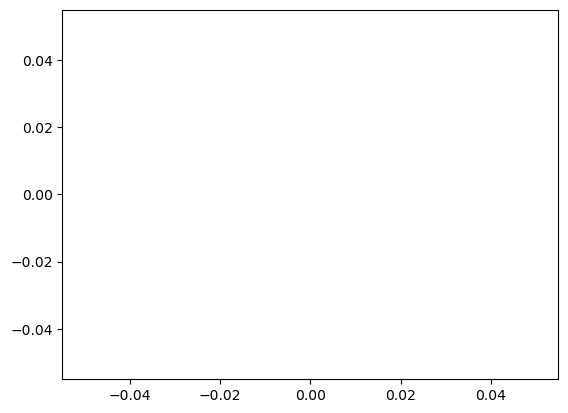

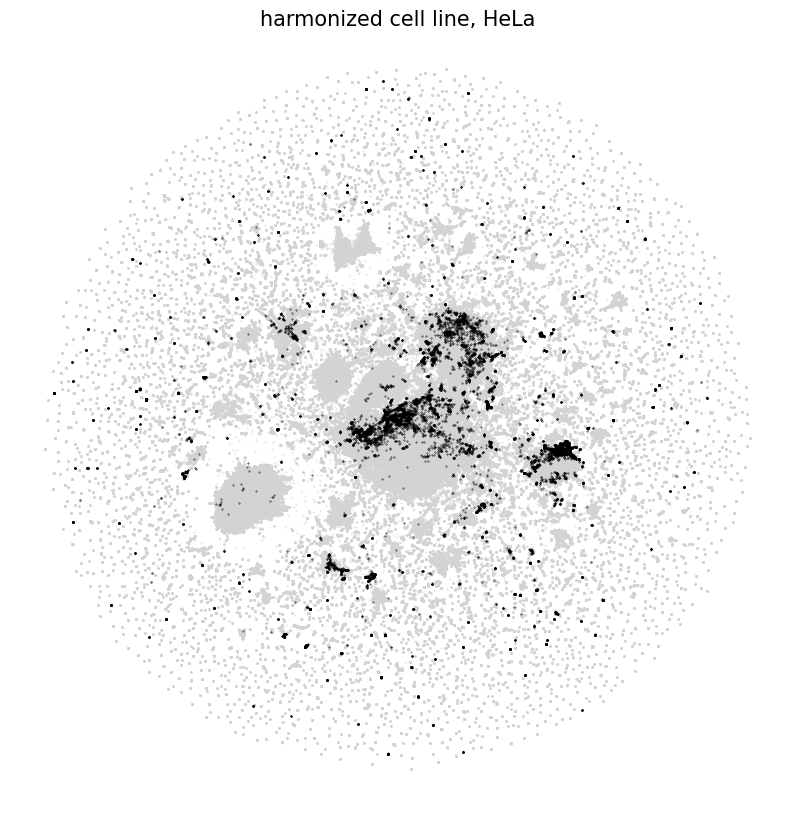

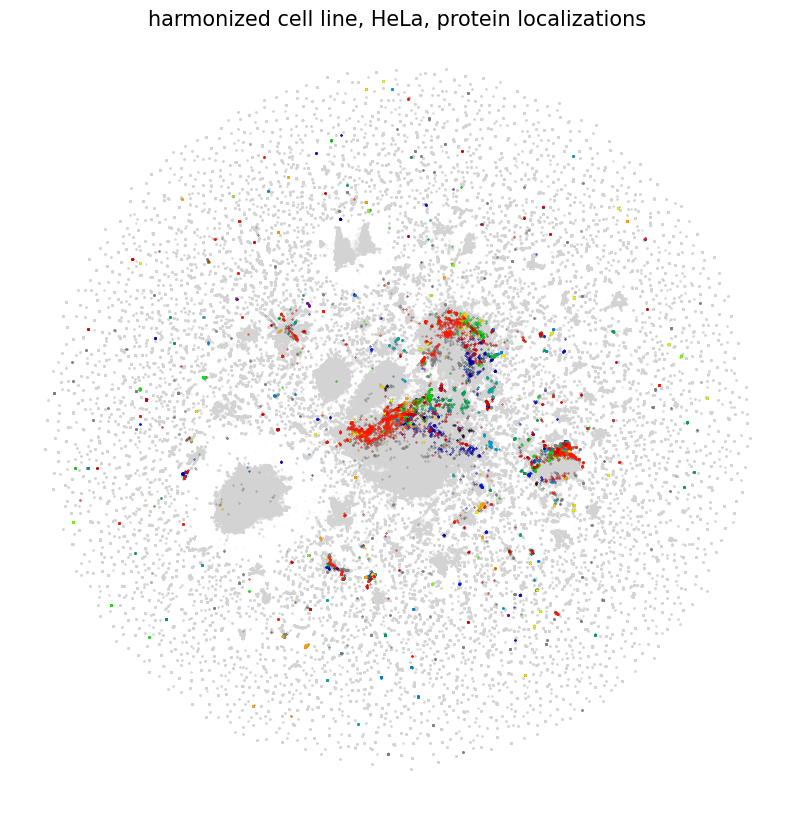

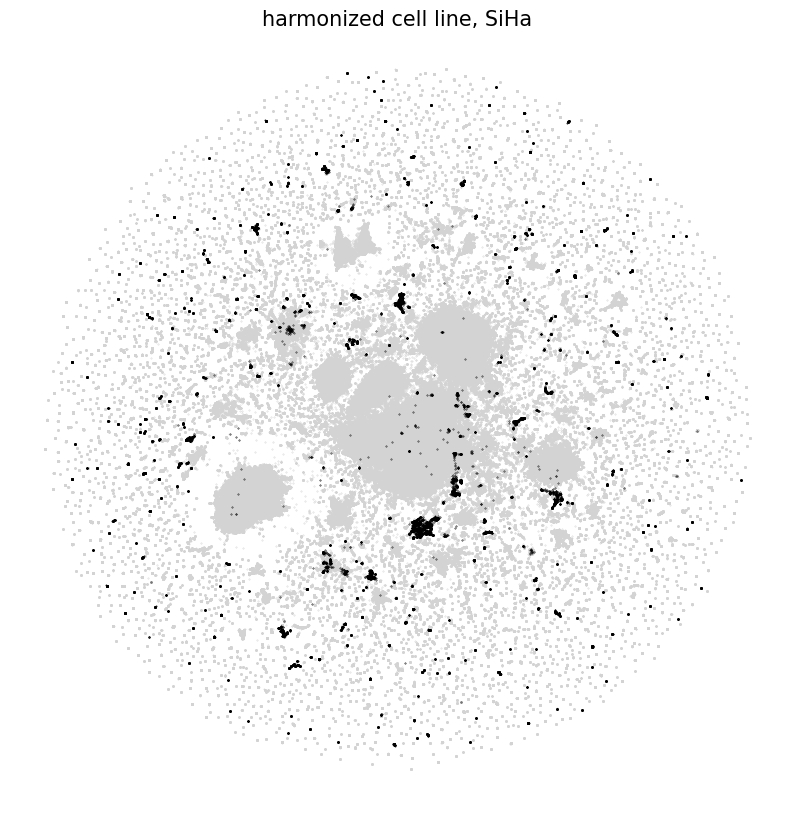

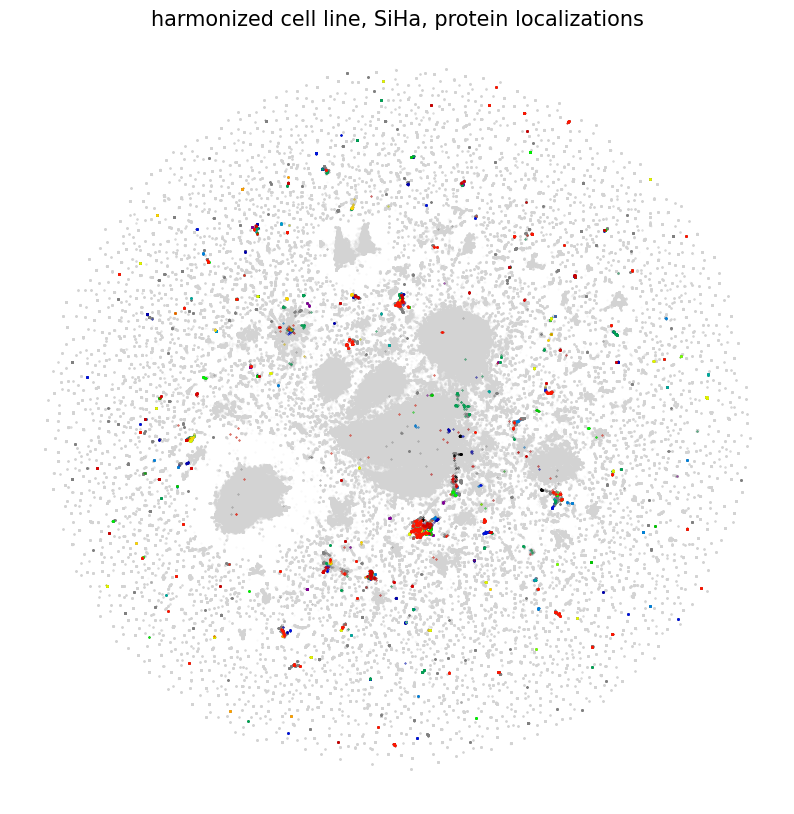

...

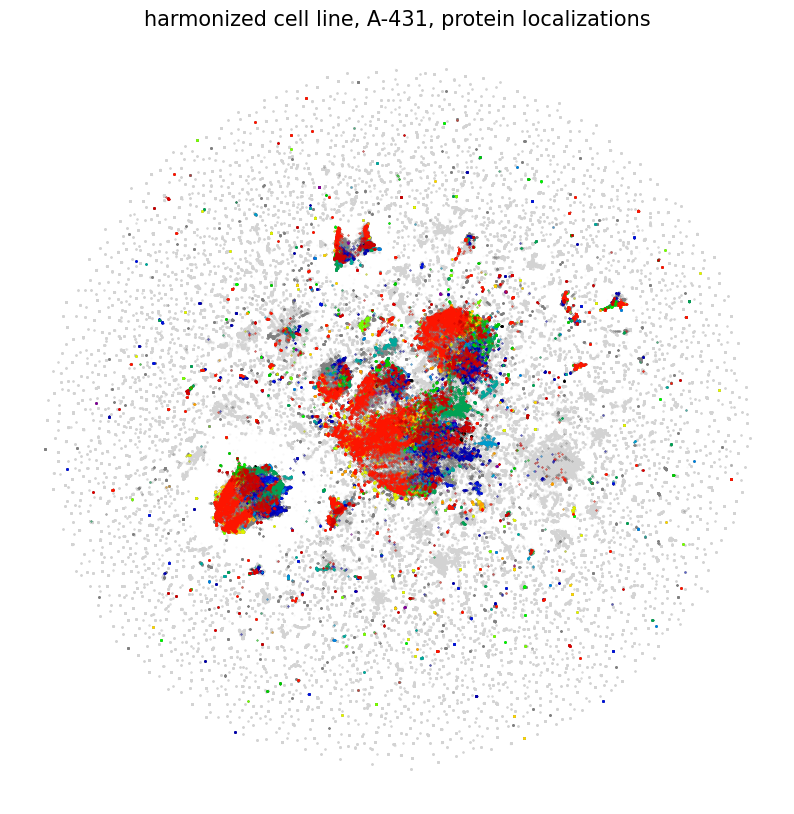

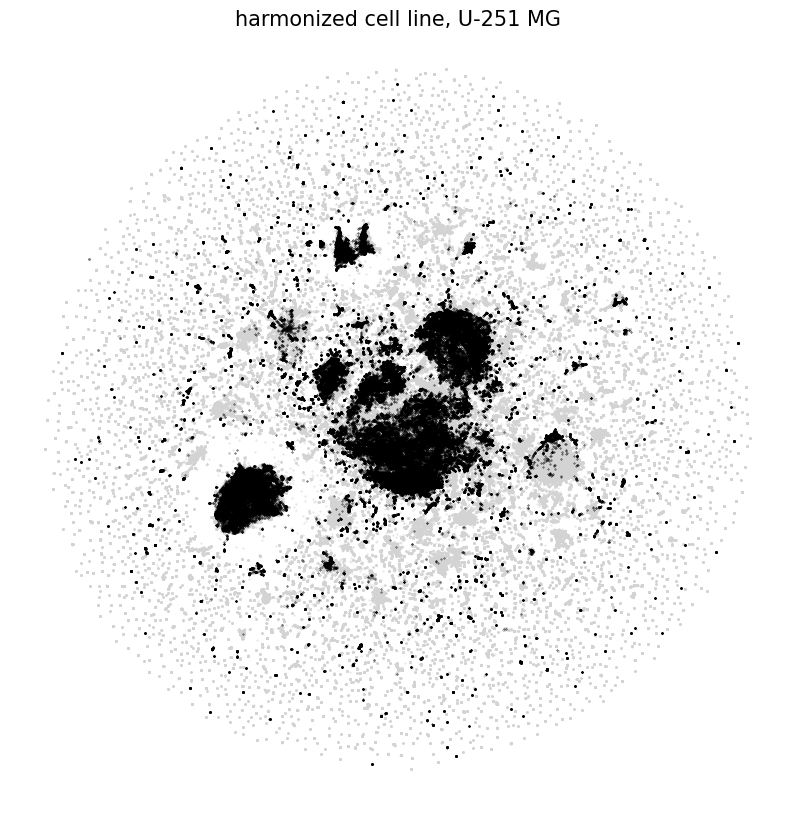

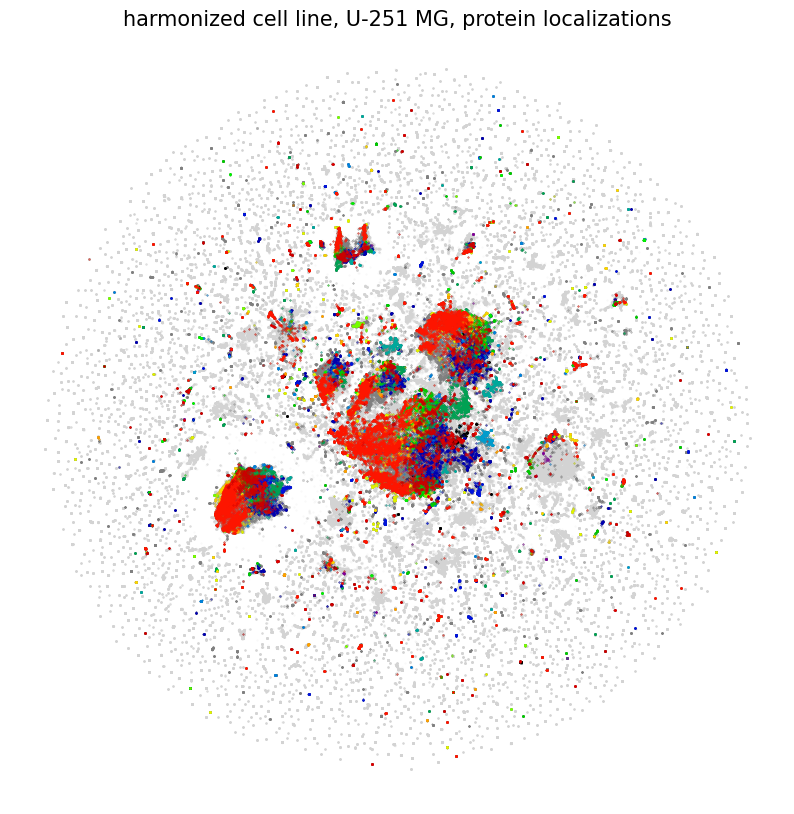

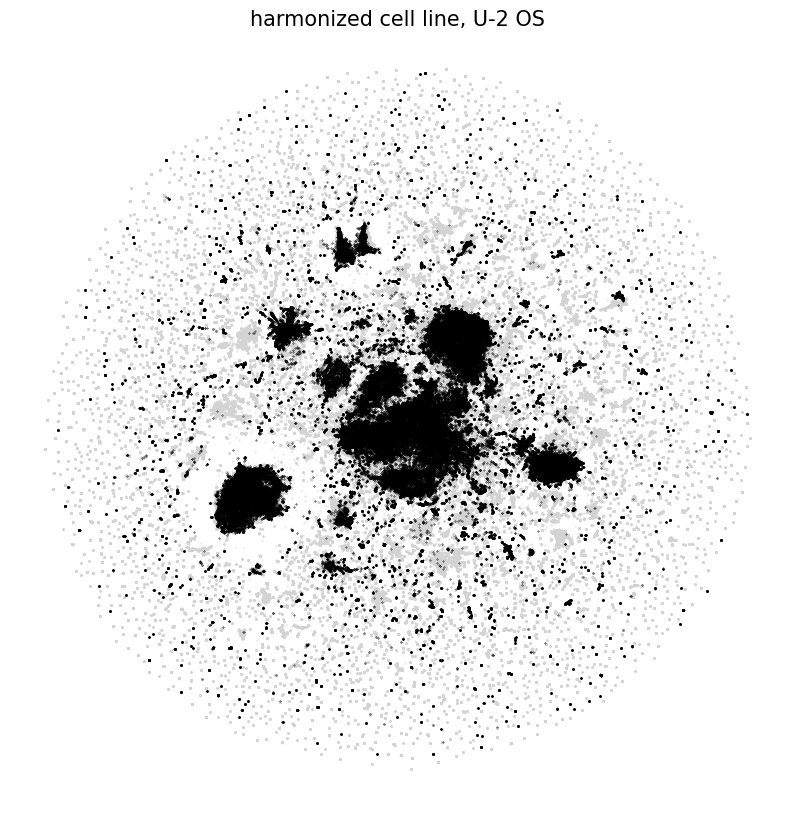

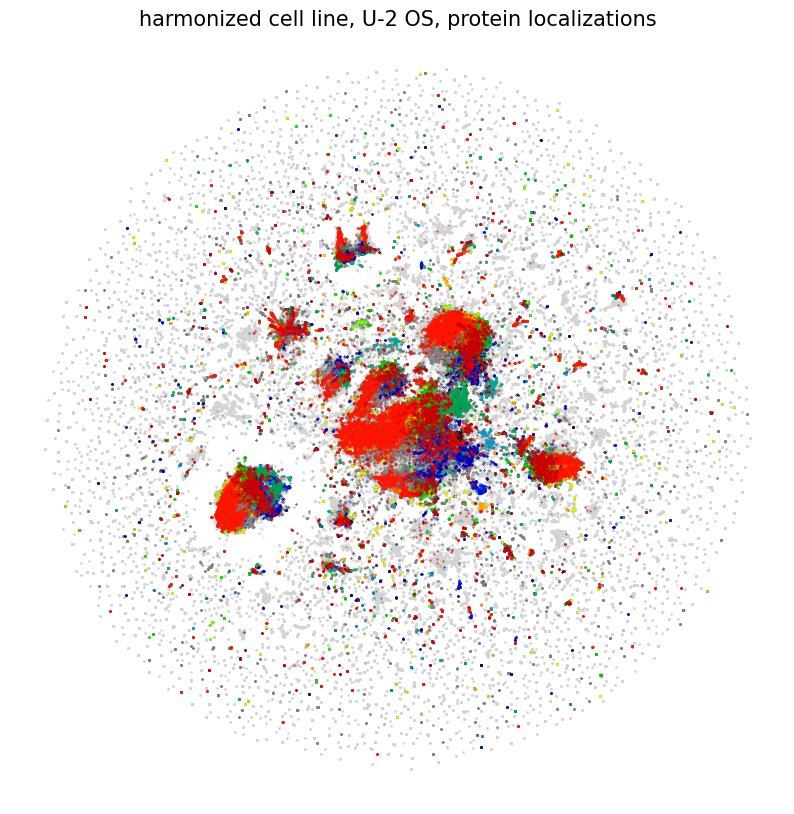

In [237]:
plot_UMAP_one_per_label(df, ['cell_type'], protein_to_num_single_cells, embedding, 'harmonized cell line')
